# Weight Initialization
In this lesson, you'll learn how to find good initial weights for a neural network. Weight initialization happens once, when a model is created and before it trains. Having good initial weights can place the neural network close to the optimal solution. This allows the neural network to come to the best solution quicker. 

<img src="notebook_ims/neuron_weights.png" width=40%/>


## Initial Weights and Observing Training Loss

To see how different weights perform, we'll test on the same dataset and neural network. That way, we know that any changes in model behavior are due to the weights and not any changing data or model structure. 
> We'll instantiate at least two of the same models, with _different_ initial weights and see how the training loss decreases over time, such as in the example below. 

<img src="notebook_ims/loss_comparison_ex.png" width=60%/>

Sometimes the differences in training loss, over time, will be large and other times, certain weights offer only small improvements.

### Dataset and Model

We'll train an MLP to classify images from the [Fashion-MNIST database](https://github.com/zalandoresearch/fashion-mnist) to demonstrate the effect of different initial weights. As a reminder, the FashionMNIST dataset contains images of clothing types; `classes = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']`. The images are normalized so that their pixel values are in a range [0.0 - 1.0).  Run the cell below to download and load the dataset.

---

### Import Libraries and Load [Data](http://pytorch.org/docs/stable/torchvision/datasets.html)

In [1]:
import torch
import numpy as np
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size = 100
# percentage of training set to use as validation
valid_size = 0.2

# convert data to torch.FloatTensor
transform = transforms.ToTensor()

# choose the training and test datasets
train_data = datasets.FashionMNIST(root='data', train=True,
                                   download=True, transform=transform)
test_data = datasets.FashionMNIST(root='data', train=False,
                                  download=True, transform=transform)

# obtain training indices that will be used for validation
num_train = len(train_data)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# prepare data loaders (combine dataset and sampler)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
    sampler=train_sampler, num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
    sampler=valid_sampler, num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, 
    num_workers=num_workers)

# specify the image classes
classes = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat', 
    'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

Extracting data/FashionMNIST/raw/train-images-idx3-ubyte.gz to data/FashionMNIST/raw


Extracting data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to data/FashionMNIST/raw


Extracting data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to data/FashionMNIST/raw


Extracting data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to data/FashionMNIST/raw
Processing...
Done!


### Visualize Some Training Data

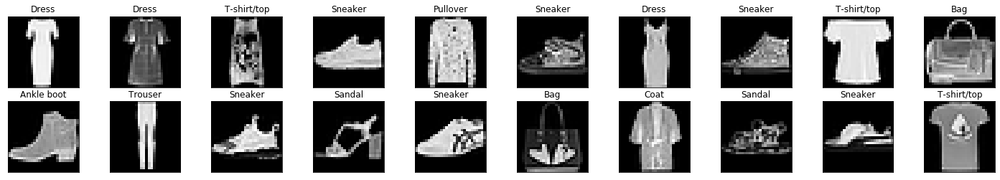

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
    
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy()

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    ax.imshow(np.squeeze(images[idx]), cmap='gray')
    ax.set_title(classes[labels[idx]])

## Define the Model Architecture

We've defined the MLP that we'll use for classifying the dataset.

### Neural Network
<img style="float: left" src="notebook_ims/neural_net.png" width=50%/>


* A 3 layer MLP with hidden dimensions of 256 and 128. 

* This MLP accepts a flattened image (784-value long vector) as input and produces 10 class scores as output.
---
We'll test the effect of different initial weights on this 3 layer neural network with ReLU activations and an Adam optimizer.  

The lessons you learn apply to other neural networks, including different activations and optimizers.

---
## Initialize Weights
Let's start looking at some initial weights.
### All Zeros or Ones
If you follow the principle of [Occam's razor](https://en.wikipedia.org/wiki/Occam's_razor), you might think setting all the weights to 0 or 1 would be the best solution.  This is not the case.

With every weight the same, all the neurons at each layer are producing the same output.  This makes it hard to decide which weights to adjust.

Let's compare the loss with all ones and all zero weights by defining two models with those constant weights.

Below, we are using PyTorch's [nn.init](https://pytorch.org/docs/stable/nn.html#torch-nn-init) to initialize each Linear layer with a constant weight. The init library provides a number of weight initialization functions that give you the ability to initialize the weights of each layer according to layer type.

In the case below, we look at every layer/module in our model. If it is a Linear layer (as all three layers are for this MLP), then we initialize those layer weights to be a `constant_weight` with bias=0 using the following code:
>```
if isinstance(m, nn.Linear):
    nn.init.constant_(m.weight, constant_weight)
    nn.init.constant_(m.bias, 0)
```

The `constant_weight` is a value that you can pass in when you instantiate the model.

In [31]:
import torch.nn as nn
import torch.nn.functional as F

# define the NN architecture
class Net(nn.Module):
    def __init__(self, hidden_1=256, hidden_2=128, constant_weight=None):
        super(Net, self).__init__()
        # linear layer (784 -> hidden_1)
        self.fc1 = nn.Linear(28 * 28, hidden_1)
        # linear layer (hidden_1 -> hidden_2)
        self.fc2 = nn.Linear(hidden_1, hidden_2)
        # linear layer (hidden_2 -> 10)
        self.fc3 = nn.Linear(hidden_2, 10)
        # dropout layer (p=0.2)
        self.dropout = nn.Dropout(0.2)
        
        # initialize the weights to a specified, constant value
        if(constant_weight is not None):
            for m in self.modules():
                if isinstance(m, nn.Linear):
                    nn.init.constant_(m.weight, constant_weight)
                    nn.init.constant_(m.bias, 0)
    
            
    def forward(self, x):
        # flatten image input
        x = x.view(-1, 28 * 28)
        # add hidden layer, with relu activation function
        x = F.relu(self.fc1(x))
        # add dropout layer
        x = self.dropout(x)
        # add hidden layer, with relu activation function
        x = F.relu(self.fc2(x))
        # add dropout layer
        x = self.dropout(x)
        # add output layer
        x = self.fc3(x)
        return x


In [48]:
total_feat_out = []
total_feat_in = []

total_grad_out = []
total_grad_in = []

# 定义 forward hook function
def hook_fn_forward(module, input, output):
    #print(module) # 用于区分模块
    #print('input', input) # 首先打印出来
    #print('output', output)
    total_feat_out.append(output) # 然后分别存入全局 list 中
    total_feat_in.append(input)

def hook_fn_backward(module, grad_input, grad_output):
    print(module) # 为了区分模块
    # 为了符合反向传播的顺序，我们先打印 grad_output
    print('grad_output', grad_output) 
    # 再打印 grad_input
    #print('grad_input', grad_input)
    # 保存到全局变量
    total_grad_in.append(grad_input)
    total_grad_out.append(grad_output)

### Compare Model Behavior

Below, we are using `helpers.compare_init_weights` to compare the training and validation loss for the two models we defined above, `model_0` and `model_1`.  This function takes in a list of models (each with different initial weights), the name of the plot to produce, and the training and validation dataset loaders. For each given model, it will plot the training loss for the first 100 batches and print out the validation accuracy after 2 training epochs. *Note: if you've used a small batch_size, you may want to increase the number of epochs here to better compare how models behave after seeing a few hundred images.* 

We plot the loss over the first 100 batches to better judge which model weights performed better at the start of training. **I recommend that you take a look at the code in `helpers.py` to look at the details behind how the models are trained, validated, and compared.**

Run the cell below to see the difference between weights of all zeros against all ones.

In [49]:
# initialize two NN's with 0 and 1 constant weights
import torch
from torch import nn
model_0 = Net(constant_weight=0)
model_1 = Net(constant_weight=1)
modules = model_1.named_children()
for name, module in modules:
    module.register_forward_hook(hook_fn_forward)
    module.register_backward_hook(hook_fn_backward)

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0010,  0.0010,  0.0010,  0.0010, -0.0090,  0.0010,  0.0010,  0.0010,
          0.0010,  0.0010],
        [ 0.0010, -0.0090,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010, -0.0090,  0.0010,
          0.0010,  0.0010],
        [ 0.0010,  0.0010, -0.0090,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010, -0.0090,  0.0010,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010, -0.0090,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010, -0.0090,  0.0010,  0.0010,  0.0010,  0.0010,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010, -0.0090,
          0.0010,  0.0010],
        [ 0.0010,  0.0010,  0.0010,  0.0010,  0.0010,  0.0010, 

grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  3.7754e-03,
          0.0000e+00,  6.2246e-03, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  8.8080e-03,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0100],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

grad_output (tensor([[5.2158e-05, 5.7376e-05, 0.0000e+00,  ..., 5.6239e-05, 5.2422e-05,
         0.0000e+00],
        [2.0506e-05, 1.0839e-05, 3.8582e-06,  ..., 1.2032e-05, 0.0000e+00,
         5.8921e-06],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.6160e-06, 0.0000e+00, 1.2665e-05,  ..., 6.3832e-06, 5.6979e-06,
         9.8660e-07]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0056, 0.0056, 0.0056,  ..., 0.0056, 0.0056, 0.0056],
        [0.0007, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.00

grad_output (tensor([[ 6.8486e-06,  1.7682e-05,  1.6799e-05,  ..., -8.1766e-06,
         -1.6843e-06,  1.7950e-05],
        [-1.0487e-05, -3.5289e-06,  3.8199e-05,  ...,  7.5304e-06,
          7.9061e-06,  1.4854e-05],
        [ 2.9321e-05,  3.5591e-05,  4.0516e-05,  ...,  1.1264e-05,
          4.1074e-05,  4.3036e-05],
        ...,
        [ 2.6448e-05,  4.4585e-05,  4.1443e-05,  ...,  1.2641e-05,
          4.6452e-05,  3.8138e-05],
        [-1.0487e-05, -3.5289e-06,  3.8199e-05,  ...,  7.5304e-06,
          7.9061e-06,  1.4854e-05],
        [ 9.1676e-07,  1.7713e-05,  1.3257e-05,  ..., -1.4572e-05,
          2.1185e-05,  1.0984e-05]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 8.5608e-06,  0.0000e+00,  2.0998e-05,  ..., -0.0000e+00,
         -0.0000e+00,  2.2438e-05],
        [-1.3109e-05, -4.4112e-06,  4.7749e-05,  ...,  9.4130e-06,
          9.8826e-06,  1.8568e-05],
        [ 3.6651e-05,  4.4489e-05,  5.0645e-05,  ...,  1.4081e-05,
          5.13

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  1.0000e-02,  2.6103e-25,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  1.5629e-20,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  7.3825e-21,
         -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  2.0593e-30,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0031, 0.0031, 0.0031,  ..., 0.0031, 0.0031, 0.0031],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        ...,
        [0.0012, 0.0012, 0.0012,  ..., 0.0012, 0.0012, 0.0012],
        [0.0013, 0.0013, 0.0013,  ..., 0.0013, 0.0013, 0.0013],
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0006]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0039, 0.0039, 0.0039,  ..., 0.0039, 0.0039, 0.0000],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        [0.0000, 0.0005, 0.0005,  ..., 0.0000, 0.0005, 0.0005],
        ...,
        [0.0016, 0.0016, 0.0016,  ..., 0.0016, 0.0016, 0.0016],
        [0.0000, 0.0016, 0.0016,  ..., 0.0016, 0.0016, 0.0016],
        [0.0007, 0.0000, 0.0007,  ..., 0.0007, 0.0007, 0.0007]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000, -0.0100,

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0034, 0.0034, 0.0034,  ..., 0.0034, 0.0034, 0.0034],
        [0.0009, 0.0000, 0.0009,  ..., 0.0009, 0.0000, 0.0000],
        [0.0024, 0.0000, 0.0024,  ..., 0.0000, 0.0024, 0.0024],
        ...,
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0000],
        [0.0038, 0.0038, 0.0038,  ..., 0.0038, 0.0038, 0.0038],
        [0.0000, 0.0000, 0.0004,  ..., 0.0004, 0.0004, 0.0004]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.5832e-25,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  9.7404e-03,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  2.5957e-04,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  2.3195e-18,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.0774e-05,  7.3549e-06,  2.6006e-05,  ...,  1.5250e-05,
         -3.2779e-05, -0.0000e+00],
        [ 1.6027e-05,  3.9575e-06, -3.3697e-06,  ...,  3.7641e-06,
         -5.3835e-06, -5.3422e-06],
        [-2.5619e-06,  1.0971e-05,  2.7159e-05,  ...,  1.0121e-05,
         -1.9840e-06, -1.0879e-05],
        ...,
        [ 9.9962e-06, -7.3495e-06, -5.4231e-06,  ...,  3.0817e-05,
         -2.1067e-05, -1.5259e-05],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  3.9575e-06, -3.3697e-06,  ...,  0.0000e+00,
         -5.3835e-06, -5.3422e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[3.8562e-04, 3.8542e-04, 3.8533e-04,  ..., 3.8549e-04, 3.8549e-04,
         3.8550e-04],
        [1.3416e-04, 1.3413e-04, 1.3403e-04,  ..., 1.3410e-04, 1.3409e-04,
         1.3414e-04],
        [5.3746e-04, 5.3738e-04, 5.3719e-04,  ..., 5.3735e-04, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[2.5901e-04, 2.5850e-04, 0.0000e+00,  ..., 2.5875e-04, 2.5869e-04,
         2.5868e-04],
        [4.5005e-05, 4.4435e-05, 4.4723e-05,  ..., 4.4735e-05, 4.4649e-05,
         4.4619e-05],
        [5.6749e-04, 5.6743e-04, 5.6706e-04,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 7.2869e-04, 7.2855e-04,  ..., 7.2873e-04, 7.2899e-04,
         7.2873e-04],
        [1.0829e-04, 1.0771e-04, 1.0793e-04,  ..., 1.0802e-04, 1.0794e-04,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 2.3195e-18,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, 

Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0009, 0.0009, 0.0009,  ..., 0.0009, 0.0009, 0.0009],
        [0.0010, 0.0010, 0.0010,  ..., 0.0010, 0.0010, 0.0010],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0001],
        ...,
        [0.0009, 0.0009, 0.0009,  ..., 0.0009, 0.0009, 0.0009],
        [0.0012, 0.0012, 0.0012,  ..., 0.0012, 0.0012, 0.0012],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0001]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000, 0.0012, 0.0000,  ..., 0.0012, 0.0012, 0.0012],
        [0.0012, 0.0012, 0.0000,  ..., 0.0000, 0.0012, 0.0012],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        ...,
        [0.0012, 0.0012, 0.0012,  ..., 0.0012, 0.0012, 0.0012],
        [0.0014, 0.0014, 0.0000,  ..., 0.0014, 0.0014, 0.0014],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  3.6251e-36,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[2.5479e-04, 2.5476e-04, 0.0000e+00,  ..., 2.5448e-04, 2.5476e-04,
         2.5473e-04],
        [0.0000e+00, 5.9103e-04, 5.9040e-04,  ..., 5.9046e-04, 5.9105e-04,
         5.9069e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 2.5722e-05,
         0.0000e+00],
        ...,
        [5.5487e-04, 5.5502e-04, 5.5436e-04,  ..., 0.0000e+00, 5.5500e-04,
         5.5465e-04],
        [3.8495e-04, 3.8516e-04, 3.8457e-04,  ..., 3.8451e-04, 0.0000e+00,
         3.8477e-04],
        [5.5390e-05, 0.0000e+00, 5.5258e-05,  ..., 5.4998e-05, 5.5406e-05,
         5.5238e-05]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.4237e-42,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  4.0832e-24,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          7.9849e-32,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  1.4056e-37],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.4013e-45,  0.0000e+00,
         -1.0000e-0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100, -0.0100],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

Dropout(p=0.2, inplace=False)
grad_output (tensor([[ 1.9775e-05,  1.0365e-05,  3.0396e-06,  ..., -1.6268e-05,
          1.4705e-05,  9.1227e-06],
        [-1.4404e-06, -8.1931e-06,  2.9978e-05,  ..., -1.7609e-05,
          3.6873e-06,  1.7620e-05],
        [ 7.7709e-06,  1.1046e-05,  1.3815e-05,  ..., -2.0182e-05,
         -1.2777e-05,  1.7327e-06],
        ...,
        [ 7.7089e-06,  1.1792e-05,  1.4021e-05,  ..., -2.1508e-05,
         -1.2180e-05,  1.5243e-06],
        [-1.4404e-06, -8.1931e-06,  2.9978e-05,  ..., -1.7609e-05,
          3.6873e-06,  1.7620e-05],
        [ 4.9207e-07, -2.1748e-06,  8.4837e-06,  ..., -1.8757e-05,
          1.7053e-05,  6.4298e-07]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 2.4719e-05,  0.0000e+00,  0.0000e+00,  ..., -2.0335e-05,
          1.8381e-05,  0.0000e+00],
        [-1.8005e-06, -1.0241e-05,  3.7473e-05,  ..., -2.2011e-05,
          0.0000e+00,  2.2025e-05],
        [ 9.7137e-06,  1.3807e-05,  1.7269e-05,  ..

Dropout(p=0.2, inplace=False)
grad_output (tensor([[-7.3565e-06,  1.6217e-05,  3.2863e-05,  ...,  2.0956e-05,
          1.1242e-05, -3.9962e-06],
        [-7.8072e-06,  5.6802e-06,  1.5025e-05,  ..., -1.1071e-06,
         -2.1661e-05, -3.6989e-06],
        [ 1.3736e-05,  1.7004e-05, -7.4731e-06,  ..., -1.4160e-05,
          1.8050e-05,  4.8860e-06],
        ...,
        [ 6.0308e-06,  9.4939e-06, -1.4871e-05,  ...,  3.1851e-06,
          1.9651e-05, -1.0336e-05],
        [ 6.7923e-06,  1.2296e-05, -2.1465e-05,  ...,  2.2142e-05,
          2.3510e-06, -1.0699e-05],
        [-7.8072e-06,  5.6802e-06,  1.5025e-05,  ..., -1.1071e-06,
         -2.1661e-05, -3.6989e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-9.1956e-06,  2.0271e-05,  4.1078e-05,  ...,  0.0000e+00,
          1.4053e-05, -4.9952e-06],
        [-9.7590e-06,  7.1003e-06,  1.8781e-05,  ..., -1.3839e-06,
         -2.7077e-05, -0.0000e+00],
        [ 1.7170e-05,  2.1255e-05, -9.3414e-06,  ..

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-4.6983e-06, -0.0000e+00,  0.0000e+00,  ...,  1.2373e-05,
         -2.5076e-06,  7.7519e-07],
        [ 1.1858e-05,  8.6156e-06,  2.2906e-05,  ...,  1.2953e-05,
         -0.0000e+00, -0.0000e+00],
        [ 1.1858e-05,  8.6156e-06,  2.2906e-05,  ...,  1.2953e-05,
         -1.2447e-05, -6.9397e-06],
        ...,
        [-4.6983e-06, -1.8080e-05,  3.3740e-05,  ...,  1.2373e-05,
         -2.5076e-06,  7.7519e-07],
        [-0.0000e+00,  7.6295e-06,  7.3809e-06,  ...,  1.3482e-06,
          1.2901e-05, -1.5691e-05],
        [ 6.1784e-06, -0.0000e+00,  2.1447e-05,  ..., -1.0386e-05,
          1.5907e-05,  5.8858e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0011, 0.0011, 0.0011,  ..., 0.0011, 0.0011, 0.0011],
        [0.0009, 0.0009, 0.0009,  ..., 0.0009, 0.0009, 0.0009],
        ...,
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.000

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-0

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0017, 0.0017, 0.0017,  ..., 0.0017, 0.0000, 0.0017],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        ...,
        [0.0000, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0010, 0.0000, 0.0010,  ..., 0.0010, 0.0000, 0.0010]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  3.5083e-33,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-1.3241e-05, -7.9393e-06,  1.2120e-05,  ...,  1.0721e-05,
          1.3031e-05,  3.1290e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [-0.0000e+00,  0.0000e+00,  1.3828e-05,  ...,  1.2267e-05,
         -9.6766e-06,  1.3597e-05],
        ...,
        [-1.1233e-05,  0.0000e+00,  7.8326e-06,  ...,  1.0574e-05,
          1.7822e-05, -6.7549e-07],
        [-1.3241e-05, -7.9393e-06,  0.0000e+00,  ...,  1.0721e-05,
          0.0000e+00,  3.1290e-06],
        [-0.0000e+00, -4.7313e-06,  1.6980e-05,  ...,  5.3509e-06,
         -0.0000e+00,  2.3934e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[1.6101e-04, 1.6095e-04, 1.6096e-04,  ..., 1.6103e-04, 1.6097e-04,
         1.6102e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.6300e-04, 6.6302e-04, 6.6246e-04,  ..., 6.6238e-04, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  9.9980e-03,  2.0343e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.1469e-26,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0024, 0.0024, 0.0024,  ..., 0.0024, 0.0024, 0.0024],
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0000],
        [0.0013, 0.0013, 0.0000,  ..., 0.0013, 0.0013, 0.0013],
        ...,
        [0.0003, 0.0003, 0.0003,  ..., 0.0000, 0.0000, 0.0003],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0012, 0.0012, 0.0012,  ..., 0.0012, 0.0012, 0.0012]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  9.7069e-03,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  2.9312e-04,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[3.6487e-04, 3.6445e-04, 3.6431e-04,  ..., 3.6418e-04, 3.6423e-04,
         3.6418e-04],
        [8.5663e-04, 8.5610e-04, 8.5544e-04,  ..., 8.5530e-04, 8.5586e-04,
         8.5517e-04],
        [9.7972e-04, 9.7922e-04, 9.7846e-04,  ..., 9.7829e-04, 9.7881e-04,
         9.7806e-04],
        ...,
        [1.2888e-04, 1.2834e-04, 1.2793e-04,  ..., 1.2820e-04, 1.2796e-04,
         1.2833e-04],
        [9.3263e-05, 9.2611e-05, 9.3043e-05,  ..., 9.3032e-05, 9.3046e-05,
         9.3172e-05],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0005, 0.0005, 0.0005,  ..., 0.0000, 0.0000, 0.0005],
        [0.0000, 0.0011, 0.0011,  ..., 0.0011, 0.0000, 0.0011],
        [0.0012, 0.0012, 0.0012,  ..., 0.0012, 0.0012, 0.0012],
        ...,
        [0.0002, 0.0002, 0.0002,  ..., 0.0000, 0.0000, 0.0002],
        [0.0001, 0.0001,

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          4.0307e-19,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.9040e-19,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  9.7069e-03,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0006],
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0000],
        [0.0002, 0.0002, 0.0000,  ..., 0.0002, 0.0002, 0.0002],
        ...,
        [0.0000, 0.0006, 0.0006,  ..., 0.0000, 0.0006, 0.0006],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0002, 0.0002, 0.0002,  ..., 0.0000, 0.0002, 0.0002]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  1.0395e-17,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100, -0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100, -0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.2339e-06,  9.9988e-03, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  1.3888e-13],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  2.2274e-41,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  9.9999e-03,
          0.0000e+00,  6.1442e-08, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[ 8.2377e-06,  1.6533e-05,  3.4491e-06,  ..., -5.6058e-07,
         -1.3793e-05,  7.3194e-06],
        [ 2.5557e-06,  7.3096e-06,  8.9644e-06,  ...,  2.2672e-05,
          2.3064e-06, -4.6239e-06],
        [ 5.1596e-06,  9.6509e-06, -5.3613e-06,  ...,  1.6835e-05,
         -9.8250e-06,  1.4429e-05],
        ...,
        [ 9.9299e-06,  2.2770e-05, -4.7755e-06,  ...,  2.9082e-05,
         -9.8697e-06, -1.4765e-05],
        [ 5.1596e-06,  9.6509e-06, -5.3613e-06,  ...,  1.6835e-05,
         -9.8250e-06,  1.4429e-05],
        [ 1.7403e-06,  2.1059e-05, -4.7318e-06,  ...,  2.1813e-05,
          2.3492e-06,  6.4001e-07]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.0297e-05,  2.0667e-05,  4.3113e-06,  ..., -7.0073e-07,
         -1.7242e-05,  0.0000e+00],
        [ 3.1946e-06,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          2.8830e-06, -5.7798e-06],
        [ 6.4495e-06,  1.2064e-05, -6.7016e-06,  ...,  0.0000e+00,
         -1.22

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  2.2977e-04,  9.7702e-03,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -6.6928e-05,  6.6929e-05,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.1705e-31,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.192

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[0.0000, 0.0000, 0.0015,  ..., 0.0015, 0.0000, 0.0000],
        [0.0000, 0.0006, 0.0000,  ..., 0.0006, 0.0000, 0.0006],
        [0.0000, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0003, 0.0000, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0024, 0.0024, 0.0000,  ..., 0.0024, 0.0000, 0.0024]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  2.2897e-13,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.6701e-07,  0.0000e+00,
 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[-1.7043e-07, -1.4019e-05,  3.0770e-06,  ..., -2.4563e-06,
          0.0000e+00,  1.1562e-05],
        [ 1.0821e-05,  7.2551e-06,  1.7656e-06,  ...,  1.2989e-05,
          2.6648e-05,  1.2757e-05],
        [ 3.0107e-05,  2.5232e-05, -3.0397e-06,  ...,  1.2144e-05,
          1.6422e-05,  2.0550e-05],
        ...,
        [ 2.4141e-05,  0.0000e+00,  7.1971e-06,  ...,  2.6759e-05,
          1.8297e-05,  2.7512e-05],
        [ 2.1513e-05,  6.2238e-06,  1.8104e-06,  ...,  1.5480e-05,
          1.3460e-05, -6.5450e-06],
        [ 1.0516e-05, -3.5527e-06,  3.3181e-06,  ..., -2.1587e-05,
         -1.2105e-05,  1.0925e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0007, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        [0.0018, 0.0018, 0.0018,  ..., 0.0018, 0.0018, 0.0018],
        ...,
        [0.0013, 0.0013, 0.0013,  ..., 0.0013, 0.0013, 0.0013],
        [0.0003, 0.0003, 0.0003,  ..., 0.

grad_output (tensor([[ 0.0000,  0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [-0.0100,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
      

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000, 

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.7639e-05,  1.2484e-05,  ...,  1.2773e-05,
          6.7988e-06, -9.2429e-07],
        [ 2.3346e-06,  2.1868e-05, -4.2664e-07,  ...,  0.0000e+00,
         -1.5507e-05, -1.1608e-05],
        [ 2.7195e-05,  0.0000e+00,  2.7884e-07,  ...,  1.8140e-05,
          7.3127e-07, -1.4565e-05],
        ...,
        [ 1.8265e-05,  2.0123e-05, -0.0000e+00,  ...,  0.0000e+00,
         -0.0000e+00,  8.7161e-06],
        [ 9.2874e-06,  1.5468e-05, -1.1483e-06,  ...,  0.0000e+00,
          0.0000e+00, -3.3945e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[3.9063e-04, 3.9070e-04, 3.8981e-04,  ..., 3.9014e-04, 3.9052e-04,
         3.9017e-04],
        [7.9393e-05, 7.9198e-05, 7.9306e-05,  ..., 7.9322e-05, 7.9170e-05,
         7.9524e-05],
        [3.7184e-04, 3.7164e-04, 3.7088e-04,  ..., 3.7107e-04, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  7.7811e-22,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000e+00, 4.8788e-04, 4.8682e-04,  ..., 4.8716e-04, 0.0000e+00,
         4.8640e-04],
        [5.3239e-05, 5.3129e-05, 5.3385e-05,  ..., 5.2967e-05, 5.2815e-05,
         5.2802e-05],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [3.9349e-04, 3.9370e-04, 3.9263e-04,  ..., 3.9335e-04, 0.0000e+00,
         3.9269e-04],
        [3.3990e-05, 3.3737e-05, 3.3679e-05,  ..., 3.3961e-05, 3.3774e-05,
         0.0000e+00],
        [2.5507e-04, 2.5538e-04, 0.0000e+00,  ..., 2.5495e-04, 2.5569e-04,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02, 

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [ 8.5938e-06,  2.7210e-05,  3.4761e-06,  ...,  1.2286e-05,
         -0.0000e+00, -1.0059e-05],
        [ 1.3487e-05,  2.0555e-05,  3.0340e-06,  ...,  0.0000e+00,
          1.2455e-05,  1.6558e-06],
        ...,
        [ 3.5613e-05,  3.3003e-05,  1.1454e-06,  ...,  2.1790e-05,
          6.8609e-06, -9.9724e-06],
        [ 0.0000e+00,  1.2955e-05,  0.0000e+00,  ..., -1.0960e-05,
         -1.5734e-05,  4.9660e-06],
        [ 0.0000e+00,  2.0555e-05,  0.0000e+00,  ...,  7.4046e-06,
          1.2455e-05,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0006],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        ...,
        [0.0008, 0.0008, 0.0008,  ..., 0.0008, 0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0000, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        ...,
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0003, 0.0003, 0.0003,  ..., 0.0000, 0.0003, 0.0003],
        [0.0001, 0.0001, 0.0000,  ..., 0.0001, 0.0001, 0.0001]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  5.0000e-03,  0.0000e+00,  5.0000e-03],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.1548e-19,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0100,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0100,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000, 

grad_output (tensor([[ 0.0000e+00,  4.4163e-35,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  8.3153e-09,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  2.2603e-08, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[-3.3882e-06, -7.5241e-06,  0.0000e+00,  ...,  0.0000e+00,
         -1.9887e-05, -8.6720e-06],
        [ 2.0333e-05,  2.5471e-08, -2.5369e-07,  ...,  1.1203e-05,
         -2.2699e-06, -1.4972e-05],
        [-3.3882e-06, -7.5241e-06,  0.0000e+00,  ...,  5.2969e-06,
         -1.9887e-05, -8.6720e-06],
        ...,
        [ 1.4478e-05, -5.6385e-06,  1.0842e-05,  ...,  1.3521e-05,
          7.2045e-06,  8.9350e-06],
        [ 2.0333e-05,  2.5471e-08, -2.5369e-07,  ...,  0.0000e+00,
         -2.2699e-06, -1.4972e-05],
        [-3.9558e-06, -2.8522e-05,  1.3988e-05,  ...,  5.9456e-07,
          0.0000e+00,  8.6682e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[1.2360e-04, 1.2332e-04, 1.2352e-04,  ..., 1.2329e-04, 1.2349e-04,
         1.2360e-04],
        [1.8829e-04, 1.8821e-04, 1.8776e-04,  ..., 1.8772e-04, 1.8809e-04,
         1.8785e-04],
        [3.1444e-05, 3.1241e-05, 3.1499e-05,  ..., 3.1333e-05, 3.1314e-05,
         3.1665e-05],
        ...,
      

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000, 

Dropout(p=0.2, inplace=False)
grad_output (tensor([[7.7246e-05, 7.7220e-05, 7.7109e-05,  ..., 7.6845e-05, 7.7197e-05,
         7.6868e-05],
        [2.0082e-04, 2.0106e-04, 2.0053e-04,  ..., 1.9991e-04, 2.0072e-04,
         2.0004e-04],
        [3.1741e-05, 3.1783e-05, 3.1988e-05,  ..., 3.1808e-05, 3.1572e-05,
         3.1548e-05],
        ...,
        [7.1427e-04, 7.1450e-04, 7.1312e-04,  ..., 7.1292e-04, 7.1387e-04,
         7.1244e-04],
        [3.4577e-05, 3.4745e-05, 3.4528e-05,  ..., 3.5035e-05, 3.4780e-05,
         3.4511e-05],
        [3.7689e-04, 3.7672e-04, 3.7594e-04,  ..., 3.7631e-04, 3.7681e-04,
         3.7601e-04]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[9.6557e-05, 9.6525e-05, 9.6386e-05,  ..., 9.6057e-05, 9.6496e-05,
         9.6086e-05],
        [2.5102e-04, 0.0000e+00, 2.5066e-04,  ..., 2.4989e-04, 0.0000e+00,
         2.5005e-04],
        [3.9676e-05, 3.9728e-05, 0.0000e+00,  ..., 3.9760e-05, 3.9465e-05,
         3.9436e-05],
  

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  2.6466e-11,  0.0000e+00,  0.0000e+00,  6.9144e-15],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[2.1866e-03, 2.1864e-03, 2.1823e-03,  ..., 2.1825e-03, 2.1865e-03,
         2.1814e-03],
        [1.1344e-34, 0.0000e+00, 1.1325e-34,  ..., 1.1320e-34, 0.0000e+00,
         1.1315e-34],
        [0.0000e+00, 9.1935e-05, 9.1561e-05,  ..., 9.2254e-05, 9.2145e-05,
         0.0000e+00],
        ...,
        [2.0845e-04, 2.0812e-04, 2.0766e-04,  ..., 0.0000e+00, 0.0000e+00,
         2.0861e-04],
        [0.0000e+00, 6.3080e-04, 6.2954e-04,  ..., 6.3013e-04, 6.3075e-04,
         6.2903e-04],
        [6.9318e-05, 6.8821e-05, 6.8668e-05,  ..., 6.9592e-05, 6.9180e-05,
         6.9734e-05]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  9.9980e-03,  0.0000e+00,  0.0000e+00,  2.0343e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  5.1756e-19],
        [ 0.0000e+00,  0.0

grad_output (tensor([[0.0014, 0.0014, 0.0014,  ..., 0.0014, 0.0014, 0.0014],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        ...,
        [0.0015, 0.0000, 0.0015,  ..., 0.0000, 0.0000, 0.0015],
        [0.0014, 0.0014, 0.0014,  ..., 0.0014, 0.0014, 0.0000],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0000, 0.0005]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.5414e-34,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.7588e-27,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.7347e-41,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          1.4625e-33,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0100,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000, 

grad_output (tensor([[6.7962e-04, 6.8026e-04, 6.7816e-04,  ..., 6.7749e-04, 6.7969e-04,
         6.7705e-04],
        [8.4300e-06, 8.0512e-06, 8.9776e-06,  ..., 8.4148e-06, 8.7387e-06,
         8.5629e-06],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [7.0757e-04, 7.0790e-04, 7.0574e-04,  ..., 0.0000e+00, 7.0776e-04,
         7.0589e-04],
        [4.4960e-04, 0.0000e+00, 4.4873e-04,  ..., 4.4862e-04, 4.4935e-04,
         4.4823e-04],
        [1.2266e-04, 0.0000e+00, 1.2218e-04,  ..., 0.0000e+00, 0.0000e+00,
         1.2237e-04]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000

         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[-8.8440e-06,  9.7852e-07,  3.4258e-06,  ...,  1.0868e-05,
          5.6910e-06, -1.5751e-07],
        [-5.9113e-06,  6.7732e-06, -2.9854e-06,  ...,  1.8398e-05,
          6.1436e-06, -3.8378e-09],
        [-2.4957e-05, -1.9464e-06,  7.2797e-06,  ...,  8.9243e-06,
          5.8225e-06, -2.4234e-06],
        ...,
        [ 2.6521e-05,  3.2098e-05,  1.2761e-05,  ...,  1.2484e-05,
          9.8305e-06,  2.2115e-06],
        [ 4.8687e-32,  4.8704e-32,  4.8601e-32,  ...,  4.8619e-32,
          4.8606e-32,  4.8595e-32],
        [-2.9347e-06, -9.9072e-06,  9.5807e-07,  ...,  6.0323e-06,
          1.5496e-05,  6.0941e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-0.0000e+00,  0.0000e+00,  4.2822e-06,  ...,  0.0000e+00,
          7.1137e-06, -1.9688e-07],
        [-7.3891e-06,  8.4665e-06, -3.7318e-06,  ...,  0.0000e+00,
         

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.4056e-37,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0000, 0.0004],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0016, 0.0016, 0.0016,  ..., 0.0016, 0.0016, 0.0016],
        ...,
        [0.0000, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        [0.0009, 0.0009, 0.0009,  ..., 0.0009, 0.0000, 0.0009],
        [0.0017, 0.0017, 0.0017,  ..., 0.0017, 0.0017, 0.0000]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  6.2996e-37,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  3.9754e-33,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

grad_output (tensor([[ 1.4606e-06,  0.0000e+00,  0.0000e+00,  ...,  3.4924e-05,
          2.0789e-05,  0.0000e+00],
        [ 1.9430e-05,  2.2751e-05, -5.3108e-06,  ...,  0.0000e+00,
          9.3335e-06, -3.3807e-06],
        [ 1.7399e-05,  0.0000e+00,  1.7128e-05,  ...,  0.0000e+00,
          2.3104e-05,  1.1798e-05],
        ...,
        [-6.2272e-06,  1.0191e-05, -0.0000e+00,  ...,  1.2195e-05,
         -2.2794e-07,  4.0060e-06],
        [-1.7746e-05,  1.2186e-05, -0.0000e+00,  ...,  0.0000e+00,
         -8.8590e-06, -4.8922e-06],
        [ 7.9123e-06,  2.4746e-05, -8.8449e-06,  ...,  3.2884e-05,
          7.0338e-07, -1.2278e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0014, 0.0014, 0.0014,  ..., 0.0014, 0.0014, 0.0014],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        [0.0007, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        ...,
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        [0.0004, 0.0004, 0.0004,  ..., 0.

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  5.2429e-24,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.8258e-17,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  7.0044e-20,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.1084e-42,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-2.9765e-05,  0.0000e+00,  8.5873e-06,  ...,  2.2714e-05,
         -0.0000e+00, -4.7142e-06],
        [-0.0000e+00,  1.1894e-05,  8.5873e-06,  ...,  2.2714e-05,
         -9.1224e-06, -4.7142e-06],
        [ 1.4707e-05,  2.4164e-05, -3.5120e-06,  ...,  0.0000e+00,
          8.3064e-06, -5.1749e-06],
        ...,
        [ 1.0976e-05, -3.4547e-07, -7.4534e-07,  ..., -2.2617e-05,
          1.1076e-05,  6.5315e-06],
        [-2.9765e-05,  0.0000e+00,  8.5873e-06,  ...,  2.2714e-05,
         -0.0000e+00, -4.7142e-06],
        [-0.0000e+00,  3.4547e-07,  0.0000e+00,  ...,  0.0000e+00,
         -1.1076e-05, -6.5315e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[9.7043e-05, 9.7027e-05, 9.6425e-05,  ..., 9.7386e-05, 9.7215e-05,
         9.6980e-05],
        [1.6078e-04, 1.6071e-04, 1.6002e-04,  ..., 1.6093e-04, 1.6087e-04,
         1.6056e-04],
        [4.7287e-04, 4.7318e-04, 4.7166e-04,  ..., 4.7223e-04, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0100, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 3.0987e-14, -1.0000e-02,  9.9997e-03,  2.7536e-07,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  1.9338e-43,  2.6103e-25,  2.4803e-43,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000, -0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000, 0.0005, 0.0005,  ..., 0.0000, 0.0005, 0.0005],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0000, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0000],
        ...,
        [0.0001, 0.0001, 0.0000,  ..., 0.0001, 0.0001, 0.0000],
        [0.0002, 0.0002, 0.0002,  ..., 0.0000, 0.0002, 0.0002],
        [0.0002, 0.0000, 0.0000,  ..., 0.0000, 0.0002, 0.0002]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

grad_output (tensor([[0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0006, 0.0006],
        [0.0008, 0.0008, 0.0008,  ..., 0.0008, 0.0008, 0.0008],
        ...,
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0008, 0.0008, 0.0008,  ..., 0.0008, 0.0008, 0.0008]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0003, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0007, 0.0007, 0.0007,  ..., 0.0007, 0.0007, 0.0000],
        [0.0010, 0.0010, 0.0000,  ..., 0.0010, 0.0000, 0.0010],
        ...,
        [0.0000, 0.0000, 0.0007,  ..., 0.0007, 0.0007, 0.0007],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0010, 0.0010, 0.0000,  ..., 0.0010, 0.0000, 0.0010]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0100,  0.0000,  0.0000, -0.0100,  0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.2484e-20],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0002, 0.0002, 0.0000,  ..., 0.0002, 0.0000, 0.0002],
        [0.0003, 0.0000, 0.0003,  ..., 0.0000, 0.0000, 0.0003],
        [0.0002, 0.0000, 0.0002,  ..., 0.0000, 0.0002, 0.0002],
        ...,
        [0.0004, 0.0004, 0.0000,  ..., 0.0000, 0.0004, 0.0004],
        [0.0004, 0.0004, 0.0000,  ..., 0.0000, 0.0004, 0.0004],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  3.2408e-41,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[1.9096e-04, 1.9112e-04, 1.9043e-04,  ..., 1.9107e-04, 1.9082e-04,
         0.0000e+00],
        [0.0000e+00, 1.2224e-03, 1.2197e-03,  ..., 0.0000e+00, 0.0000e+00,
         1.2181e-03],
        [2.6659e-05, 0.0000e+00, 0.0000e+00,  ..., 2.6682e-05, 2.7154e-05,
         2.6454e-05],
        ...,
        [9.6806e-04, 0.0000e+00, 0.0000e+00,  ..., 9.6553e-04, 9.6768e-04,
         9.6503e-04],
        [3.7918e-04, 3.7939e-04, 3.7862e-04,  ..., 3.7819e-04, 3.7894e-04,
         3.7830e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 1.4249e-03,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 7.0955e-25,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000e+00, 0.0000e+00, 1.7594e-06,  ..., 1.6795e-06, 0.0000e+00,
         0.0000e+00],
        [4.2458e-04, 4.2460e-04, 4.2409e-04,  ..., 4.2379e-04, 4.2474e-04,
         0.0000e+00],
        [1.1044e-04, 1.1057e-04, 0.0000e+00,  ..., 0.0000e+00, 1.1061e-04,
         1.0990e-04],
        ...,
        [2.8953e-04, 2.8934e-04, 2.8888e-04,  ..., 2.8787e-04, 2.8974e-04,
         2.8830e-04],
        [1.8332e-04, 0.0000e+00, 0.0000e+00,  ..., 1.8243e-04, 1.8372e-04,
         0.0000e+00],
        [5.0015e-04, 5.0043e-04, 4.9964e-04,  ..., 0.0000e+00, 5.0040e-04,
         4.9973e-04]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, 

grad_output (tensor([[3.1028e-05, 0.0000e+00, 3.1138e-05,  ..., 3.0371e-05, 3.1268e-05,
         3.0603e-05],
        [4.3953e-04, 4.3994e-04, 4.3826e-04,  ..., 4.3804e-04, 4.3944e-04,
         4.3813e-04],
        [1.8231e-03, 1.8240e-03, 1.8205e-03,  ..., 1.8184e-03, 0.0000e+00,
         1.8175e-03],
        ...,
        [2.5153e-04, 2.5166e-04, 2.5087e-04,  ..., 2.5068e-04, 0.0000e+00,
         2.5045e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.3157e-04, 4.3199e-04, 4.3056e-04,  ..., 4.3009e-04, 4.3164e-04,
         4.3016e-04]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  3.2408e-41, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000, -0.0100,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0100, -0.0100,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.7785e-05,  0.0000e+00,  0.0000e+00,  ..., -1.9553e-05,
         -1.2466e-05,  1.6422e-05],
        [-1.6923e-05, -2.0315e-05,  8.4816e-06,  ..., -1.9118e-06,
         -0.0000e+00,  1.6322e-05],
        [-1.1682e-06, -1.3767e-05,  0.0000e+00,  ..., -0.0000e+00,
          1.2655e-05,  1.6719e-05],
        ...,
        [ 1.2935e-06, -6.5340e-06,  1.0957e-05,  ...,  1.5906e-05,
          9.1856e-06,  1.1371e-05],
        [ 1.2935e-06, -6.5340e-06,  1.0957e-05,  ...,  1.5906e-05,
          9.1856e-06,  1.1371e-05],
        [-1.6923e-05, -2.0315e-05,  8.4816e-06,  ..., -0.0000e+00,
         -3.9528e-06,  1.6322e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[2.5057e-04, 2.5054e-04, 2.5014e-04,  ..., 2.4985e-04, 2.5036e-04,
         2.4981e-04],
        [5.3756e-05, 5.3897e-05, 5.3846e-05,  ..., 5.3330e-05, 5.4137e-05,
         5.3274e-05],
        [5.3155e-04, 5.3179e-04, 5.3078e-04,  ..., 5.2992e-04, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000e+00, 1.1719e-04, 1.1675e-04,  ..., 1.1709e-04, 1.1687e-04,
         1.1665e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [6.1178e-04, 6.1230e-04, 0.0000e+00,  ..., 6.1062e-04, 6.1121e-04,
         6.1001e-04],
        ...,
        [8.7292e-04, 8.7290e-04, 8.7158e-04,  ..., 8.7128e-04, 8.7268e-04,
         8.7050e-04],
        [8.3521e-05, 8.3919e-05, 8.3563e-05,  ..., 8.4080e-05, 8.3623e-05,
         8.3674e-05],
        [0.0000e+00, 1.8224e-04, 1.8192e-04,  ..., 1.8189e-04, 1.8203e-04,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          4.1363e-29,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, 

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 2.0771e-05,  3.6568e-06, -5.9963e-06,  ..., -9.2044e-06,
          1.5998e-05, -4.7642e-07],
        [ 2.0771e-05,  3.6568e-06, -5.9963e-06,  ..., -9.2044e-06,
          1.5998e-05, -0.0000e+00],
        [ 3.6656e-06,  1.1660e-07, -0.0000e+00,  ...,  7.5547e-06,
          2.3444e-06,  8.9090e-06],
        ...,
        [ 1.3731e-05,  1.4845e-06, -1.5672e-05,  ..., -6.3517e-08,
          1.2495e-05,  4.5597e-06],
        [ 0.0000e+00,  1.1462e-05, -7.6863e-06,  ...,  0.0000e+00,
         -4.7876e-06, -8.1328e-06],
        [ 2.4927e-05,  2.7330e-05, -6.4375e-06,  ...,  0.0000e+00,
          9.1419e-06, -1.7290e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        ...,
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0007, 0.0007, 0.0000,  ..., 0.0007, 0.0000, 0.0007],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        ...,
        [0.0006, 0.0006, 0.0006,  ..., 0.0006, 0.0000, 0.0006],
        [0.0001, 0.0001, 0.0000,  ..., 0.0001, 0.0001, 0.0001],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0000, 0.0000]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  3.6283e-17,
          0.0000e+00,  4.3635e-11, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[8.7591e-04, 0.0000e+00, 8.7465e-04,  ..., 0.0000e+00, 8.7587e-04,
         8.7379e-04],
        [3.5686e-04, 3.5681e-04, 3.5608e-04,  ..., 3.5638e-04, 3.5688e-04,
         3.5667e-04],
        [0.0000e+00, 2.0933e-04, 0.0000e+00,  ..., 2.0989e-04, 2.0955e-04,
         0.0000e+00],
        ...,
        [3.5817e-10, 3.5835e-10, 3.5768e-10,  ..., 3.5725e-10, 3.5818e-10,
         3.5709e-10],
        [0.0000e+00, 7.9835e-04, 7.9695e-04,  ..., 7.9649e-04, 7.9782e-04,
         7.9611e-04],
        [3.9261e-04, 3.9276e-04, 0.0000e+00,  ..., 3.9185e-04, 3.9238e-04,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  3.7750e-13,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  4.5398e-07,  0.0000e+00,  9.9995e-03],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.6904e-31,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  9.8542e-36,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  4.3596e-30, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  2.2293e-22,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  6.2186e-32,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  6.2186e-32, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  3.9754e-33,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  5.0435e-09, -1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  3.7492e-20,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 2.4134e-14,  7.2813e-35,  0.000

grad_output (tensor([[ 2.0154e-05,  0.0000e+00, -0.0000e+00,  ..., -1.8615e-05,
          0.0000e+00, -1.0731e-05],
        [ 2.0278e-05,  1.2384e-05,  1.5309e-05,  ...,  0.0000e+00,
          3.7524e-05,  0.0000e+00],
        [ 0.0000e+00,  3.1600e-05, -1.1334e-05,  ...,  3.6252e-06,
          8.0651e-06, -1.3058e-05],
        ...,
        [ 2.5997e-05,  3.2895e-05,  1.4637e-05,  ...,  1.4684e-05,
          3.1214e-05,  1.2630e-05],
        [ 5.5528e-06,  0.0000e+00, -6.5260e-07,  ...,  0.0000e+00,
         -6.1257e-06, -1.0189e-05],
        [ 2.5997e-05,  3.2895e-05,  1.4637e-05,  ...,  1.4684e-05,
          3.1214e-05,  1.2630e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[1.4251e-04, 1.4256e-04, 1.4231e-04,  ..., 1.4209e-04, 1.4234e-04,
         1.4211e-04],
        [1.9821e-03, 1.9833e-03, 1.9800e-03,  ..., 1.9769e-03, 1.9823e-03,
         1.9751e-03],
        [9.4435e-05, 9.4334e-05, 9.4118e-05,  ..., 9.4352e-05, 9.4237e-05,
         9.3839e-05],
        ...,
      

grad_output (tensor([[ 0.0000e+00,  2.0837e-05,  1.6219e-05,  ...,  8.0499e-06,
          2.3886e-05,  2.3816e-05],
        [-5.9852e-06,  1.4349e-05,  7.7191e-06,  ...,  1.0410e-05,
         -7.9067e-06,  0.0000e+00],
        [-1.4756e-05,  3.9694e-06, -6.0913e-07,  ...,  3.4969e-06,
          0.0000e+00,  1.6275e-06],
        ...,
        [ 1.4030e-07,  2.4408e-05, -3.7360e-06,  ...,  2.6541e-06,
          0.0000e+00,  5.0338e-06],
        [-4.4728e-06,  6.8057e-06,  0.0000e+00,  ...,  1.9999e-06,
          1.3752e-05,  0.0000e+00],
        [ 1.1322e-05,  0.0000e+00,  0.0000e+00,  ..., -9.0107e-06,
         -2.5342e-06,  9.0490e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0018, 0.0019, 0.0018,  ..., 0.0018, 0.0018, 0.0018],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0001],
        ...,
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0006, 0.0006, 0.0006,  ..., 0.

grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-0

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[6.4826e-04, 6.4860e-04, 6.4728e-04,  ..., 6.4601e-04, 6.4784e-04,
         6.4587e-04],
        [3.7194e-05, 3.7439e-05, 0.0000e+00,  ..., 3.7214e-05, 3.7291e-05,
         3.7126e-05],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.3124e-04, 1.3118e-04, 1.3083e-04,  ..., 1.3017e-04, 1.3081e-04,
         1.3004e-04],
        [1.3285e-03, 1.3291e-03, 1.3269e-03,  ..., 1.3244e-03, 1.3283e-03,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  3.3057e-39, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  1.1084e-42,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.8287e-42,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  3.7751e-13,  1.0000e-02,  0.0000e+00,
          1.4437e-28, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  8.2671e-03,  1.7329e-03,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[ 5.4404e-06,  1.9588e-05,  7.5139e-07,  ...,  5.2731e-06,
          1.0609e-05,  1.3227e-05],
        [-3.9855e-06,  2.8722e-06,  2.1774e-07,  ..., -1.7389e-06,
          9.6560e-06,  9.5811e-06],
        [-8.8684e-06,  6.8108e-06,  1.9463e-06,  ...,  7.9394e-06,
          8.3093e-06,  5.0828e-06],
        ...,
        [ 7.2230e-06,  5.4324e-06, -1.0355e-05,  ..., -1.6937e-05,
          6.6450e-06,  5.3743e-06],
        [-6.0161e-06,  6.7043e-06,  2.3438e-06,  ...,  9.2448e-06,
         -9.6428e-06,  8.5035e-06],
        [ 5.4404e-06,  1.9588e-05,  7.5139e-07,  ...,  5.2731e-06,
          1.0609e-05,  1.3227e-05]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 6.8005e-06,  2.4484e-05,  9.3924e-07,  ...,  6.5913e-06,
          1.3261e-05,  1.6534e-05],
        [-4.9819e-06,  0.0000e+00,  0.0000e+00,  ..., -2.1736e-06,
          1.2070e-05,  0.0000e+00],
        [-1.1086e-05,  8.5135e-06,  0.0000e+00,  ...,  9.9243e-06,
          1.03

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 2.6626e-23,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  1.2005e-34],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  2.1705e-31,  0.0000e+00],
        [ 1.9674e-22,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  4.2290e-29,  7.9627e-03,  1.3837e-03,
         -1.0000e-02,  6.5362e-04,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  6.7262e-43,  2.8625e-22,
          0.0000e+00,  1.2005e-34,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  2.4766e-24,  2.8998e-27,  1.0000e-02,
          0.0000e+00,  3.1809e-43,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  2.8439e-04,  6.0988e-09,  7.3345e-03,
         -1.0000e-02,  2.3811e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.3336e-36,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0253e-31,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  7.781

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0816e-13,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  7.3760e-40,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [ 0.0000,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0100,  0.0000],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.2897e-13, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  4.4738e-40,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.8998e-27,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  3.3086e-20,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.7139e-17,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  8.2013e-23,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  3.0988e-14,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.2464e-31,  0.0000e+00,
         -1.6452e-03,  1.6452e-03,  0.0000e+00,  0.0000e+00,  5.4761e-33],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.2005e-34,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[ 5.2691e-10,  5.2668e-10,  5.1362e-10,  ...,  5.0993e-10,
          5.2812e-10,  5.1306e-10],
        [ 1.5083e-05,  1.4801e-05, -6.2335e-06,  ..., -1.1949e-05,
          1.6570e-05, -7.0619e-06],
        [-2.2401e-06,  9.9657e-06, -3.7627e-06,  ..., -8.8143e-06,
          2.0765e-05, -6.8263e-06],
        ...,
        [-2.0184e-06,  2.2780e-07, -4.2972e-06,  ..., -1.3872e-05,
          1.9300e-05, -4.1711e-06],
        [ 1.4427e-05,  2.0358e-05,  5.8542e-06,  ..., -1.1085e-05,
          1.8179e-05,  4.0748e-06],
        [ 1.5878e-05,  7.4647e-06,  1.0643e-07,  ...,  1.1967e-05,
         -3.3213e-06,  1.0963e-05]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 0.0000e+00,  6.5835e-10,  6.4202e-10,  ...,  6.3742e-10,
          6.6015e-10,  6.4132e-10],
        [ 1.8853e-05,  1.8501e-05, -7.7918e-06,  ..., -1.4936e-05,
          2.0713e-05, -0.0000e+00],
        [-0.0000e+00,  1.2457e-05, -0.0000e+00,  ..

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.9213e-37,  2.3497e-23,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-0

grad_output (tensor([[ 1.5417e-05,  2.1239e-06,  3.9503e-07,  ..., -1.1403e-05,
          1.7998e-06,  8.1655e-06],
        [ 1.7214e-05, -2.5114e-06, -9.4552e-06,  ..., -8.0501e-06,
          1.0360e-07, -6.3855e-07],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        ...,
        [ 1.1994e-05, -1.2538e-05, -1.1143e-06,  ..., -4.9516e-06,
         -1.0245e-05,  9.0016e-06],
        [ 1.1994e-05, -1.2538e-05, -1.1143e-06,  ..., -4.9516e-06,
         -1.0245e-05,  9.0016e-06],
        [ 1.0321e-06, -1.3460e-05, -7.5872e-06,  ..., -9.9793e-06,
          4.3509e-06,  3.9920e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.9271e-05,  2.6549e-06,  4.9379e-07,  ..., -1.4253e-05,
          2.2498e-06,  1.0207e-05],
        [ 2.1517e-05, -3.1392e-06, -1.1819e-05,  ..., -1.0063e-05,
          0.0000e+00, -7.9819e-07],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.00

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  2.1151e-21,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  4.7851e-08,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  8.2581e-16,
          1.0000e-02,  1.0052e-33, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  5.1756e-19,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  7.6812e-17,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          1.0531e-22, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.5461e-40,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  1.9480e-23],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.5230e-10,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  5.9768e-36,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  2.1705e-31,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  6.6929e-05,  9.9331e-03,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  2.115

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  3.9790e-14,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  8.9319e-27,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  9.8091e-45, -1.0000e-02,  5.9768e-36,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  4.9061e-37,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  2.2897e-13,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  1.9023e-38],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  1.7139e-17],
        [-7.4863e-07,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.7123e-36,  0.0000e+00,  7.4846e-07,  2.5743e-39],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  5.3111e-29,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.6038e-30, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  8.1934e-42, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.1548e-19,  0.0000e+00,  9.4710e-40,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  7.5826e-12,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  2.8998e-27,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 9.9974e-03, -9.9974e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 3.7718e-32,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  1.6247e-35,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02,  5.1756e-19,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  1.7817e-32,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0052e-33,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  3.8974e-35,  0.0000e+00],
        [ 0.0000e+00,  1.1861e-10,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -4.8876e-08,  0.0000e+00,  4.7851e-08,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.1253e-09,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.9375e-32,  0.0000e+00,  1.0000e-02,  3.6503e-29,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  2.8601e-41,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.7139e-17,  0.000

grad_output (tensor([[9.2564e-05, 9.3119e-05, 0.0000e+00,  ..., 9.1560e-05, 9.2572e-05,
         9.2735e-05],
        [3.4542e-04, 0.0000e+00, 0.0000e+00,  ..., 3.4436e-04, 3.4570e-04,
         0.0000e+00],
        [2.2772e-04, 0.0000e+00, 2.2698e-04,  ..., 2.2632e-04, 0.0000e+00,
         2.2700e-04],
        ...,
        [2.2226e-04, 2.2287e-04, 2.2127e-04,  ..., 2.2080e-04, 2.2213e-04,
         2.2135e-04],
        [2.2179e-04, 2.2241e-04, 0.0000e+00,  ..., 2.2051e-04, 2.2177e-04,
         2.2098e-04],
        [1.2523e-04, 1.2597e-04, 1.2530e-04,  ..., 1.2445e-04, 1.2561e-04,
         1.2538e-04]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  3.0563e-28,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  6.7262e-43,  3.9244e-28,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  1.9538e-29,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0742e-20,  6.4759e-09,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.1698e-24,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.5230e-10,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  4.6589e-17,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.2664e-16,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 5.8243e-26,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 9.7069e-03,  2.9312e-04,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 5.8243e-26,  1.0000e-02,  0.000

grad_output (tensor([[-1.0596e-05,  4.1318e-06,  2.2491e-06,  ..., -0.0000e+00,
          5.1260e-06,  0.0000e+00],
        [-0.0000e+00,  2.6045e-06,  1.2232e-05,  ..., -4.5727e-06,
          0.0000e+00, -1.3717e-05],
        [-4.8108e-06,  5.3519e-07, -0.0000e+00,  ...,  1.2188e-06,
         -9.4706e-06,  0.0000e+00],
        ...,
        [ 2.0471e-06,  0.0000e+00,  0.0000e+00,  ..., -2.2386e-06,
         -2.6524e-07, -0.0000e+00],
        [-3.3510e-06,  2.6045e-06,  1.2232e-05,  ..., -4.5727e-06,
          1.5142e-05, -1.3717e-05],
        [-7.2451e-06,  1.5270e-06, -9.9833e-06,  ...,  1.4085e-06,
         -0.0000e+00,  1.8043e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[8.1717e-05, 8.2081e-05, 8.1596e-05,  ..., 8.1520e-05, 8.2042e-05,
         8.1819e-05],
        [1.2537e-04, 1.2562e-04, 1.2530e-04,  ..., 1.2466e-04, 1.2521e-04,
         1.2538e-04],
        [4.2564e-05, 4.2708e-05, 4.2389e-05,  ..., 4.2811e-05, 4.2946e-05,
         4.2354e-05],
        ...,
      

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          5.4651e-44,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0100],
        [ 0.0000, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
         -0.0100,  0.0100],
        [-0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0100],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  3.1727e-05,  9.9683e-03,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  3.3631e-44,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  5.4651e-44,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  2.9312e-04,  9.7069e-03,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  5.3111e-29,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000, -0.0100,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000,  0.0000, -0.0100,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000, -0.0100,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100, -0.0100,  0.0000,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100,  0.0000, -0.0100,  0.0000,  0.0000,  0.0000,
          0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0100,  0.0000,  0.0000,  0.0000, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  2.3803e-28,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  6.3432e-30,  0.0000e+00,
          1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          3.4873e-21,  0.0000e+00,  0.0000e+00,  6.0600e-22,  4.2484e-20],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-1.3614e-05,  7.3361e-06, -5.1226e-06,  ...,  1.3551e-05,
          1.2034e-05,  9.5508e-08],
        [ 8.6430e-06, -3.8995e-07,  6.5909e-06,  ...,  2.0917e-05,
          3.7005e-05,  0.0000e+00],
        [-1.0157e-05,  0.0000e+00,  4.9727e-06,  ...,  9.9318e-06,
          1.9563e-05, -5.8914e-06],
        ...,
        [-2.3548e-07, -0.0000e+00, -2.0828e-06,  ...,  0.0000e+00,
          2.2494e-05, -0.0000e+00],
        [ 1.5878e-06,  6.9589e-06, -2.5889e-06,  ...,  1.8402e-05,
          1.6315e-05,  1.1966e-05],
        [ 1.6099e-21,  0.0000e+00,  1.6099e-21,  ...,  1.6107e-21,
          1.6125e-21,  1.6098e-21]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[2.0211e-04, 2.0268e-04, 2.0224e-04,  ..., 2.0176e-04, 2.0234e-04,
         2.0167e-04],
        [6.6731e-04, 6.6836e-04, 6.6589e-04,  ..., 6.6497e-04, 6.6746e-04,
         6.6542e-04],
        [2.7581e-05, 2.8207e-05, 2.7780e-05,  ..., 2.7453e-05, 

Dropout(p=0.2, inplace=False)
grad_output (tensor([[1.5191e-19, 1.5203e-19, 1.5162e-19,  ..., 1.5141e-19, 1.5191e-19,
         1.5140e-19],
        [9.4937e-05, 9.5411e-05, 9.5269e-05,  ..., 9.4495e-05, 9.4770e-05,
         9.4875e-05],
        [6.6065e-04, 6.6142e-04, 6.5980e-04,  ..., 6.5872e-04, 6.6051e-04,
         6.5870e-04],
        ...,
        [4.6481e-04, 4.6464e-04, 4.6339e-04,  ..., 4.6291e-04, 4.6451e-04,
         4.6283e-04],
        [7.0480e-04, 7.0543e-04, 7.0365e-04,  ..., 7.0268e-04, 7.0468e-04,
         7.0254e-04],
        [2.6836e-04, 2.6816e-04, 2.6801e-04,  ..., 2.6761e-04, 2.6818e-04,
         2.6749e-04]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[1.8989e-19, 1.9004e-19, 1.8953e-19,  ..., 1.8926e-19, 1.8989e-19,
         0.0000e+00],
        [1.1867e-04, 1.1926e-04, 1.1909e-04,  ..., 1.1812e-04, 0.0000e+00,
         1.1859e-04],
        [0.0000e+00, 8.2677e-04, 8.2475e-04,  ..., 8.2340e-04, 8.2563e-04,
         8.2337e-04],
  

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  3.2661e-15,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  2.3175e-37],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0987e-04,  9.8901e-03],
        [ 1.4013e-45,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  7.4048e-27],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  7.0967e-06,  9.9929e-03,
          0.0000e+00,  2.3458e-42,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.4725e-26,  9.6102e-07,  9.9990e-03,
         -1.0000e-02,  7.6276e-24,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0002, 0.0002, 0.0000,  ..., 0.0002, 0.0000, 0.0002],
        [0.0002, 0.0002, 0.0000,  ..., 0.0002, 0.0002, 0.0002],
        [0.0002, 0.0002, 0.0002,  ..., 0.0000, 0.0000, 0.0002],
        ...,
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0006, 0.0000, 0.0006,  ..., 0.0006, 0.0006, 0.0006],
        [0.0002, 0.0002, 0.0000,  ..., 0.0002, 0.0000, 0.0000]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.6458e-40,
          0.0000e+00, -1.0000e-02,  2.0880e-16,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.9040e-19, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  9.8091e-45,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0262e-12,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.1390e-33,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  5.3802e-34,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  2.1705e-31,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.8287e-42],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.4013e-45],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 5.1756e-19,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  6.5544e-33,  5.1756e-19,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.7347e-41,  0.0000e+00],
        [ 6.8256e-10,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0322e-05,  0.0000e+00,  0.0000e+00,  8.5757e-31,
         -1.0000e-02,  9.9897e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  5.8291e-07,  0.0000e+00,  0.0000e+00,  9.9994e-03,
          0.0000e+00,  4.8428e-32,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  9.9753e-03,  9.4559e-21,  0.0000e+00,  2.3439e-23,
          0.0000e+00, -9.9753e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  4.9704e-42,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.9040e-19, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  9.9593e-03,
          0.0000e+00,  4.0701e-05,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  2.2696e-20,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 3.1364e-38,  0.0000e+00,  1.0000e-02,  3.4842e-40,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[-4.7850e-06, -1.1472e-05, -9.8785e-06,  ..., -1.9941e-06,
          6.1605e-07, -7.4723e-06],
        [ 4.7850e-06,  1.1472e-05,  9.8785e-06,  ...,  1.9941e-06,
         -6.1605e-07,  7.4723e-06],
        [ 8.8095e-06, -1.4256e-05,  9.5339e-06,  ..., -1.1447e-06,
          1.1646e-06, -5.7410e-06],
        ...,
        [ 9.9513e-06, -1.0770e-05,  7.5841e-06,  ...,  3.6999e-07,
          1.1061e-06,  1.1265e-05],
        [ 7.8092e-41,  7.7922e-41,  7.8026e-41,  ...,  7.8031e-41,
          7.8069e-41,  7.8009e-41],
        [ 1.3092e-05, -1.6405e-06,  3.1497e-06,  ...,  1.1252e-05,
          4.7884e-06,  5.6509e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-5.9812e-06, -0.0000e+00, -1.2348e-05,  ..., -0.0000e+00,
          7.7006e-07, -9.3404e-06],
        [ 5.9812e-06,  1.4341e-05,  1.2348e-05,  ...,  2.4926e-06,
         -0.0000e+00,  9.3404e-06],
        [ 1.1012e-05, -1.7820e-05,  0.0000e+00,  ..

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 5.0027e-06, -2.7148e-06,  7.9948e-06,  ..., -1.8352e-05,
         -2.3875e-06, -1.8264e-06],
        [ 2.6744e-14,  0.0000e+00,  2.6730e-14,  ...,  2.6712e-14,
          2.6722e-14,  2.6716e-14],
        [ 1.8116e-05, -4.2958e-06,  6.5092e-06,  ...,  8.0767e-06,
          0.0000e+00, -6.3697e-06],
        ...,
        [ 1.4493e-05,  1.3685e-05,  6.3155e-06,  ...,  6.0472e-06,
         -0.0000e+00,  5.2606e-06],
        [ 3.1264e-06, -0.0000e+00,  6.8351e-06,  ...,  6.1845e-06,
          4.2420e-06,  5.9964e-06],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[6.9896e-05, 6.9864e-05, 6.9332e-05,  ..., 6.8851e-05, 6.9653e-05,
         6.9050e-05],
        [2.2337e-12, 2.2351e-12, 2.2292e-12,  ..., 2.2269e-12, 2.2340e-12,
         2.2252e-12],
        [8.5430e-04, 8.5488e-04, 8.5230e-04,  ..., 8.5158e-04, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0008, 0.0008, 0.0000,  ..., 0.0008, 0.0008, 0.0008],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0000, 0.0003],
        [0.0003, 0.0000, 0.0003,  ..., 0.0003, 0.0000, 0.0000],
        ...,
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0000, 0.0002],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0000, 0.0001]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.5832e-25,  0.0000e+00,  7.4786e-26,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  1.5230e-10],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.2161e-39,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 6.3815e-42,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          4.1078e-36,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[ 1.7092e-05,  9.5030e-06,  2.1469e-05,  ...,  1.3687e-05,
          0.0000e+00,  1.4957e-05],
        [ 1.3216e-05, -7.8524e-06,  1.4749e-05,  ..., -5.3163e-06,
          1.8325e-06,  6.5528e-07],
        [ 2.0159e-11,  2.0136e-11,  2.0164e-11,  ...,  2.0145e-11,
          2.0152e-11,  0.0000e+00],
        ...,
        [ 8.4741e-07, -1.7008e-05, -1.6771e-05,  ...,  0.0000e+00,
          0.0000e+00, -6.0437e-06],
        [ 6.5134e-06,  9.6125e-06, -0.0000e+00,  ...,  1.5557e-05,
          7.7579e-06,  0.0000e+00],
        [ 1.1288e-06,  5.8776e-06,  1.3933e-05,  ...,  0.0000e+00,
         -1.4126e-06,  5.1415e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[8.9673e-04, 8.9736e-04, 8.9513e-04,  ..., 8.9490e-04, 8.9718e-04,
         8.9394e-04],
        [3.6579e-04, 3.6604e-04, 3.6505e-04,  ..., 3.6502e-04, 3.6587e-04,
         3.6453e-04],
        [1.5526e-09, 1.5539e-09, 1.5501e-09,  ..., 1.5488e-09, 1.5531e-09,
         1.5473e-09],
        ...,
      

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.2839e-05, -1.6017e-05, -0.0000e+00,  ..., -2.1275e-06,
          0.0000e+00, -6.5615e-06],
        [-1.5404e-06,  1.4345e-05,  3.2140e-07,  ..., -1.1530e-05,
          1.2274e-05, -9.7207e-07],
        [ 1.5769e-05,  4.0411e-06,  0.0000e+00,  ..., -9.6004e-06,
          9.0938e-06,  2.2227e-06],
        ...,
        [ 1.3510e-05,  0.0000e+00,  2.5882e-07,  ..., -2.2795e-06,
          9.3814e-06,  1.5084e-05],
        [ 0.0000e+00, -1.6017e-05, -8.0158e-06,  ..., -0.0000e+00,
          1.2105e-05, -6.5615e-06],
        [-3.6779e-06, -4.7590e-06, -4.6154e-06,  ..., -5.4347e-06,
          6.5033e-06,  5.9156e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        ...,
        [0.0007, 0.0007, 0.0007,  ..., 0.0006, 0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 3.7835e-44,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.3780e-39,  0.0000e+00,  1.752

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[1.1376e-04, 1.1393e-04, 1.1406e-04,  ..., 1.1383e-04, 1.1392e-04,
         0.0000e+00],
        [5.1300e-05, 5.1347e-05, 0.0000e+00,  ..., 5.0354e-05, 5.1257e-05,
         5.1036e-05],
        [8.5586e-05, 8.5617e-05, 8.5587e-05,  ..., 8.5178e-05, 8.5748e-05,
         8.5337e-05],
        ...,
        [0.0000e+00, 8.6088e-05, 8.5962e-05,  ..., 8.5161e-05, 8.6228e-05,
         0.0000e+00],
        [0.0000e+00, 8.5704e-05, 8.5773e-05,  ..., 8.4869e-05, 8.5946e-05,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 4.5160e-04,  ..., 4.5158e-04, 4.5326e-04,
         0.0000e+00]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  6.3432e-30,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0531e-22,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  3.4873e-21,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          4.5634e-38,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 7.0659e-06, -0.0000e+00,  3.0532e-06,  ...,  3.0849e-06,
          3.2988e-07, -1.3886e-05],
        [ 1.4305e-05, -1.3894e-05,  8.4295e-06,  ..., -1.0401e-05,
          3.3921e-06,  1.2085e-06],
        [ 1.2278e-05, -8.3352e-08,  1.6768e-05,  ..., -4.7576e-06,
         -7.4152e-07, -3.0056e-06],
        ...,
        [ 1.2278e-05, -8.3352e-08,  0.0000e+00,  ..., -4.7576e-06,
         -7.4152e-07, -3.0056e-06],
        [ 0.0000e+00, -2.1063e-05,  0.0000e+00,  ...,  0.0000e+00,
          3.2988e-07, -0.0000e+00],
        [ 4.7628e-06, -4.2493e-06,  1.6100e-05,  ..., -7.1750e-06,
          0.0000e+00, -4.7858e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[9.3013e-05, 9.3533e-05, 9.3016e-05,  ..., 9.3247e-05, 9.3506e-05,
         9.3152e-05],
        [3.8684e-04, 3.8695e-04, 3.8614e-04,  ..., 3.8608e-04, 3.8694e-04,
         3.8589e-04],
        [1.5282e-04, 1.5265e-04, 1.5245e-04,  ..., 1.5256e-04, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  9.8091e-45,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.7710e-20,  1.3256e-24,  5.7444e-40,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.3312e-43, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  8.5846e-31,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  9.471

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  2.6442e-30],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0957e-18,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  6.2241e-13],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.1920e-03,  8.8080e-03,  0.0000e+00,  5.1301e-26],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[8.1304e-40, 8.1345e-40, 8.1124e-40,  ..., 8.1055e-40, 8.1301e-40,
         8.0972e-40],
        [2.8872e-04, 2.8904e-04, 2.8865e-04,  ..., 2.8788e-04, 2.8901e-04,
         2.8800e-04],
        [6.4751e-06, 6.6218e-06, 6.4279e-06,  ..., 6.9594e-06, 6.5014e-06,
         6.1854e-06],
        ...,
        [3.2128e-05, 3.2111e-05, 3.2351e-05,  ..., 3.1732e-05, 3.2463e-05,
         3.2002e-05],
        [1.1745e-04, 1.1744e-04, 1.1760e-04,  ..., 1.1711e-04, 1.1772e-04,
         1.1727e-04],
        [2.1273e-04, 2.1310e-04, 2.1261e-04,  ..., 2.1229e-04, 2.1295e-04,
         2.1185e-04]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[1.0163e-39, 1.0168e-39, 1.0140e-39,  ..., 1.0132e-39, 1.0163e-39,
         1.0121e-39],
        [3.6090e-04, 3.6129e-04, 0.0000e+00,  ..., 3.5985e-04, 3.6126e-04,
         0.0000e+00],
        [8.0938e-06, 8.2772e-06, 8.0349e-06,  ..., 8.6992e-06, 0.0000e+00,
         0.0000e+00],
        ...,
        [4.0161e-05

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  7.5858e-04,  3.0549e-39,  9.2414e-03,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  3.3535e-06,  0.0000e+00, -3.3534e-06,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 5.7100e-28,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  3.0471e-22,  2.5186e-16,  2.4279e-26,  0.0000e+00],
        [ 1.7124e-36,  0.0000e+00,  1.1099e-23,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  3.0171e-23,  0.0000e+00,  4.4777e-21,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  2.3497e-23,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  5.3802e-34,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  9.471

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 9.5791e-03,  0.0000e+00,  4.2088e-04,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.3652e-23],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.1861e-10,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.9538e-29,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 3.8473e-30,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 6.9982e-39, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02, -1.0000e-02,  3.2437e-22,  0.0000e+00,
          0.0000e+00,  1.2161e-39,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  9.9029e-03, -1.0000e-02,  9.7085e-05,  0.0000e+00,
          0.0000e+00,  2.1643e-24,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  3.2213e-29,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+0

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [-1.1069e-05,  9.1265e-06,  0.0000e+00,  ...,  1.3843e-05,
          0.0000e+00, -0.0000e+00],
        [-4.3022e-06,  0.0000e+00, -0.0000e+00,  ...,  1.2508e-05,
          9.3326e-06,  2.4047e-06],
        ...,
        [ 5.8500e-06, -2.0112e-06, -1.2855e-05,  ..., -1.0276e-05,
          1.9432e-06, -8.4224e-07],
        [ 2.9383e-06,  5.8820e-06, -2.8358e-06,  ...,  9.1136e-06,
          6.9380e-06, -8.0171e-06],
        [ 5.8500e-06, -2.0112e-06, -1.2855e-05,  ..., -0.0000e+00,
          0.0000e+00, -0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [2.0299e-04, 2.0332e-04, 2.0288e-04,  ..., 2.0292e-04, 2.0313e-04,
         2.0230e-04],
        [2.0072e-04, 2.0088e-04, 2.0022e-04,  ..., 2.0023e-04, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[0.0008, 0.0008, 0.0008,  ..., 0.0008, 0.0008, 0.0008],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        ...,
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0009, 0.0009, 0.0009,  ..., 0.0009, 0.0009, 0.0009],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0000],
        [0.0002, 0.0000, 0.0002,  ..., 0.0002, 0.0000, 0.0002],
        ...,
        [0.0004, 0.0004, 0.0000,  ..., 0.0004, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  9.3576e-16,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  1.7362e-22,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[ 5.8945e-06,  6.8583e-07, -0.0000e+00,  ...,  3.6645e-06,
         -1.5308e-06,  1.8070e-05],
        [ 5.8945e-06,  0.0000e+00, -1.6112e-05,  ...,  3.6645e-06,
         -1.5308e-06,  0.0000e+00],
        [ 4.6372e-06, -6.3119e-06, -9.3559e-06,  ...,  7.2094e-06,
          7.0514e-06,  7.8705e-06],
        ...,
        [ 4.6372e-06, -6.3119e-06, -9.3559e-06,  ...,  7.2094e-06,
          7.0514e-06,  7.8705e-06],
        [ 0.0000e+00, -3.7345e-06, -5.0823e-06,  ...,  4.2815e-06,
          4.8895e-06,  1.0741e-05],
        [ 5.0644e-06, -1.8657e-05, -1.2200e-05,  ..., -2.5998e-06,
          8.7786e-07,  5.8775e-06]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[2.6678e-04, 2.6703e-04, 2.6668e-04,  ..., 2.6629e-04, 2.6708e-04,
         2.6618e-04],
        [2.0647e-04, 2.0649e-04, 2.0650e-04,  ..., 2.0603e-04, 2.0663e-04,
         2.0602e-04],
        [5.2497e-05, 5.2304e-05, 5.2725e-05,  ..., 5.2189e-05, 5.2777e-05,
         5.2319e-05],
        ...,
      

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  5.6757e-16,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  2.8026e-45,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  9.7069e-03,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  2.9312e-04,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[ 9.5856e-07,  1.1709e-05,  9.5287e-06,  ..., -1.7212e-06,
          8.9288e-07, -8.9444e-07],
        [ 1.0860e-05,  5.0661e-06,  5.4255e-06,  ...,  4.3630e-06,
          5.2713e-06,  8.7921e-06],
        [ 1.0860e-05,  5.0661e-06,  5.4255e-06,  ...,  4.3630e-06,
          5.2713e-06,  8.7921e-06],
        ...,
        [ 9.5856e-07,  1.1709e-05,  9.5287e-06,  ..., -1.7212e-06,
          8.9288e-07, -8.9444e-07],
        [ 9.1564e-07,  1.0209e-05, -5.6645e-06,  ..., -6.5304e-07,
         -3.9709e-06,  1.0411e-05],
        [ 4.4132e-06, -8.7425e-06, -8.8462e-06,  ..., -4.0565e-06,
          2.2078e-06,  5.8933e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 1.1982e-06,  0.0000e+00,  1.1911e-05,  ..., -2.1514e-06,
          1.1161e-06, -1.1181e-06],
        [ 1.3575e-05,  6.3327e-06,  6.7819e-06,  ...,  0.0000e+00,
          6.5891e-06,  1.0990e-05],
        [ 0.0000e+00,  6.3327e-06,  6.7819e-06,  ..

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  2.1724e-12,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  3.7754e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  6.2246e-03,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  7.5858e-04,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  9.2414e-03,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  6.1813e-20,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  4.5360e-26,  8.1448e-30],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  7.7343e-10,  8.9397e-08,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  6.7262e-43,  9.9999e-03],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  5.1756e-19,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  4.5950e-31,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.3697e-27],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  8.7642e-10,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  8.6320e-43,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.2612e-44, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  3.8740e-23],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  9.9912e-22],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.7195e-22,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.4805e-03,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  8.5195e-03],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.2431e-04,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  2.1178e-07,  9.8755e-03],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  5.4502e-39,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 2.9578e-25,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0668e-27,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.0207e-13],
        [ 0.0000e+00, -1.0000e-02,  0.000

grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0604e-15,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.6458e-40],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  8.4160e-33,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.8049e-37,
          0.0000e+0

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [-7.0832e-06,  1.1207e-05,  1.1856e-05,  ...,  2.1401e-06,
          3.4394e-06,  2.6602e-07],
        [ 1.4584e-06,  1.9586e-05,  2.1678e-05,  ...,  2.9350e-06,
          1.0680e-06, -3.9097e-06],
        ...,
        [ 2.5716e-06,  1.9969e-05,  5.0012e-06,  ...,  1.3795e-05,
          7.3972e-06,  1.4517e-05],
        [-9.9756e-07, -3.5933e-06,  3.5373e-06,  ...,  3.6660e-06,
          9.6169e-06,  3.3595e-06],
        [-7.4136e-06,  5.5405e-06,  6.5729e-06,  ...,  2.3633e-05,
          9.1016e-06,  1.8438e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  0.0000e+00,
          0.0000e+00,  0.0000e+00],
        [-8.8540e-06,  1.4008e-05,  1.4820e-05,  ...,  2.6752e-06,
          4.2993e-06,  3.3253e-07],
        [ 1.8230e-06,  0.0000e+00,  2.7098e-05,  ...,  3.6687e-06,
          0.00

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[4.2597e-04, 4.2671e-04, 4.2520e-04,  ..., 0.0000e+00, 4.2647e-04,
         4.2450e-04],
        [4.5672e-04, 4.5757e-04, 4.5621e-04,  ..., 4.5589e-04, 0.0000e+00,
         0.0000e+00],
        [1.0644e-04, 1.0702e-04, 1.0580e-04,  ..., 1.0633e-04, 0.0000e+00,
         1.0638e-04],
        ...,
        [1.1644e-05, 1.1552e-05, 0.0000e+00,  ..., 1.1392e-05, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 7.4223e-04, 7.4000e-04,  ..., 7.3985e-04, 7.4184e-04,
         0.0000e+00],
        [5.8905e-04, 5.8987e-04, 5.8794e-04,  ..., 0.0000e+00, 5.8923e-04,
         5.8719e-04]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 8.4235e-14,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.7522e-15,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02],
        [ 2.6102e-25, -1.0000e-02,  0.0000e+00,  0.0000e+00,  3.5356e-07,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  9.9996e-03],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.6261e-16,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.1548e-19,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.5615e-39],
        [-1.1921e-09,  0.0000e+00,  1.4450e-09,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.5768e-20],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 9.9977e-03,  0.0000e+00,  1.9943e-08,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.3051e-06],
        [ 0.0000e+00,  0.0000e+00,  7.2813e-35,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 4.0551e-31,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.4013e-45,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  5.2409e-43],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  5.4502e-39,  1.0121e-26],
        [ 9.3245e-03, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  6.7547e-04,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 4.3366e-04,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.3928e-24,
         -1.0000e-02,  0.0000e+00,  5.2658e-38,  9.5663e-03,  1.9688e-08],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0262e-12,  1.2818e-40],
        [ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.5832e-25,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+0

          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[ 5.0459e-07, -7.9831e-06,  2.4795e-06,  ..., -2.4316e-06,
          6.6255e-06,  2.9291e-06],
        [ 4.5974e-07, -2.0865e-06,  8.4797e-06,  ...,  1.2857e-05,
          9.8517e-06,  2.9601e-07],
        [ 4.6293e-06, -1.1419e-05,  9.7044e-06,  ..., -3.7656e-06,
          1.2942e-05,  3.8611e-06],
        ...,
        [ 1.3564e-05, -7.4537e-06,  4.5905e-06,  ..., -3.8494e-06,
          7.0009e-06,  6.2011e-07],
        [ 1.2487e-05, -3.7368e-06,  1.0677e-05,  ...,  1.1532e-05,
          1.8326e-05,  1.3798e-05],
        [ 1.4386e-06, -8.5769e-06,  4.7954e-06,  ...,  2.5404e-06,
          1.7725e-05, -6.2987e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 6.3074e-07, -9.9789e-06,  3.0994e-06,  ..., -3.0396e-06,
          8.2819e-06,  3.6614e-06],
        [ 5.7467e-07, -2.6081e-06,  0.0000e+00,  ...,  1.6071e-05,
         

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  4.3036e-25,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  1.1548e-19,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.5832e-25,  0.0000e+00,  1.0000e-02,  7.0955e-25,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  3.6745e-22,  0.0000e+00,  9.9972e-03,  2.7803e-06,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  3.2957e-30,  0.0000e+00, -9.7069e-03,  9.7069e-03,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0262e-12,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.9947e-08,  1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.000

Dropout(p=0.2, inplace=False)
grad_output (tensor([[0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0001],
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0004, 0.0004],
        ...,
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0000],
        [0.0002, 0.0002, 0.0000,  ..., 0.0000, 0.0002, 0.0002],
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0000, 0.0005],
        ...,
        [0.0004, 0.0004, 0.0004,  ..., 0.0004, 0.0000, 0.0000],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
        [0.0002, 0.0002, 0.0002,  ..., 0.0000, 0.0002, 0.0002]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.2741e-28,  0.0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  9.6607e-38,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          9.1382e-31,  0.0000e+00, -1.0000e-02,  1.7088e-11,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.9538e-29,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  4.2191e-27,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.6374e-09,  0.0000e+00],
        [ 0.0000e+00,  9.9999e-03,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.0830e-32,
         -1.0000e-02,  2.3695e-19,  0.0000e+00,  1.2672e-38,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  6.2186e-32,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,  2.0612e-11,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 6.9083e-34,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  2.0612e-11,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  9.9224e-29],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  4.8431e-32,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.166

grad_output (tensor([[ 7.8837e-06,  2.5002e-05,  1.4282e-05,  ...,  1.6943e-05,
         -2.5396e-06,  2.7347e-05],
        [-4.5423e-06,  0.0000e+00,  2.1364e-06,  ..., -3.7805e-06,
         -0.0000e+00,  1.4855e-05],
        [ 2.2997e-05,  5.3189e-06,  8.9380e-06,  ...,  1.4553e-05,
          1.5275e-05,  2.0550e-05],
        ...,
        [-4.5423e-06,  2.1961e-07,  2.1364e-06,  ..., -3.7805e-06,
         -5.5198e-06,  1.4855e-05],
        [ 3.6131e-06,  1.7932e-06,  5.2329e-06,  ...,  2.1155e-07,
          3.5192e-06,  0.0000e+00],
        [ 1.6111e-05,  1.5854e-05,  0.0000e+00,  ...,  3.0971e-05,
          1.0808e-05,  2.4014e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[7.0705e-04, 7.0786e-04, 7.0511e-04,  ..., 7.0477e-04, 7.0708e-04,
         7.0397e-04],
        [1.8392e-05, 1.8540e-05, 1.8336e-05,  ..., 1.7944e-05, 1.8693e-05,
         1.8071e-05],
        [5.3278e-04, 5.3342e-04, 5.3205e-04,  ..., 5.3172e-04, 5.3279e-04,
         5.3066e-04],
        ...,
      

Dropout(p=0.2, inplace=False)
grad_output (tensor([[2.2253e-04, 2.2301e-04, 2.2156e-04,  ..., 2.2176e-04, 2.2212e-04,
         2.2153e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.1541e-05, 1.1646e-05, 1.1998e-05,  ..., 1.1929e-05, 1.1748e-05,
         1.1756e-05],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1510e-04, 4.1530e-04, 4.1378e-04,  ..., 4.1356e-04, 4.1476e-04,
         4.1329e-04],
        [2.3976e-05, 2.4167e-05, 2.3364e-05,  ..., 2.3444e-05, 2.3402e-05,
         2.3506e-05]]),)
Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0000e+00, 2.7876e-04, 2.7695e-04,  ..., 2.7720e-04, 2.7764e-04,
         2.7691e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [1.4427e-05, 1.4558e-05, 1.4997e-05,  ..., 1.4911e-05, 0.0000e+00,
         1.4694e-05],
  

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  8.1934e-42,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  8.1757e-03,  1.8243e-03,  1.1389e-19,
         -1.0000e-02,  8.2251e-15,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  4.1931e-15, -1.0000e-02,  1.5844e-06,
          0.0000e+00,  9.9984e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  1.8217e-44,
          0.0000e+00,  8.7039e-17,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0668e-27,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  3.3631e-44,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  8.4160e-33,  0.0000e+00],
        [ 2.3803e-28,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 6.2246e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  3.7754e-03, -1.0000e-02],
        [ 3.7327e-04,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  9.6267e-03,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0806e-32,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 3.4425e-16, -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  5.6707e-35,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 5.1756e-19,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  4.5398e-07, -1.0000e-02,  0.0000e+00,  9.9995e-03,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  3.7232e-27,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  1.4013e-45,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0677e-08,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.4013e-45,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          2.5613e-08,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  3.5817e-12,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.5012e-05,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.5012e-05,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.4056e-37,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.3635e-11,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.3888e-13,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  3.3953e-30,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  3.3631e-44,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  1.3697e-27,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  3.3057e-39,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.2015e-15,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  5.1245e-20,  3.897

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  3.6503e-29,  0.0000e+00,  1.0000e-02,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  3.8242e-18,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  1.3348e-17,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  3.5786e-31,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 2.0107e-07,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.9267e-05,  0.0000e+00,  9.9805e-03,  0.0000e+00],
        [ 4.6589e-17,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.7139e-17,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  1.9040e-19,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  9.9929e-03,  0.0000e+00,  7.0967e-06, -1.0000e-02],
        [ 9.9996e-03, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  2.5436e-15,  0.0000e+00,  3.5356e-07,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 5.6079e-06,  1.4454e-05,  6.4959e-06,  ...,  0.0000e+00,
          9.1608e-06,  1.1447e-05],
        [ 4.6386e-06,  3.9984e-06, -1.8473e-07,  ...,  1.1021e-05,
          6.7263e-06,  1.5144e-05],
        [ 4.2936e-11,  0.0000e+00,  4.2889e-11,  ...,  4.2909e-11,
          4.2934e-11,  0.0000e+00],
        ...,
        [ 5.2370e-06, -2.0004e-06,  1.5429e-06,  ...,  1.2593e-05,
          8.5552e-06,  1.5195e-05],
        [ 4.6386e-06,  3.9984e-06, -0.0000e+00,  ...,  0.0000e+00,
          6.7263e-06,  1.5144e-05],
        [ 0.0000e+00, -1.4292e-05,  1.1986e-06,  ...,  4.3769e-06,
          0.0000e+00, -1.1535e-05]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[3.7151e-04, 3.7218e-04, 3.7105e-04,  ..., 3.7086e-04, 3.7159e-04,
         3.7033e-04],
        [2.8348e-04, 2.8361e-04, 2.8264e-04,  ..., 2.8262e-04, 2.8373e-04,
         2.8256e-04],
        [3.0240e-09, 3.0265e-09, 3.0159e-09,  ..., 3.0154e-09, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0003, 0.0000, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0002, 0.0002, 0.0002,  ..., 0.0002, 0.0002, 0.0002],
        [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0003, 0.0003],
        ...,
        [0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0005, 0.0005],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0000, 0.0001],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0000]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 2.7536e-07,  0.0000e+00,  9.9997e-03,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  3.2661e-15,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.8243e-03, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 7.9609e-26,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.9198e-20,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02,  4.6243e-44],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  1.9155e-31,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  1.9155e-31,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 8.3153e-09,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  1.1254e-09, -1.0000e-02],
        [ 4.7426e-04,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          9.5257e-03,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 5.2201e-05,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          9.9478e-03,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 1.1628e-12,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  4.9704e-42,  0.0000e+00],
        [ 1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          2.5088e-29,  0.0000e+00,  0.0000e+00,  1.4815e-38,  0.0000e+00],
        [ 1.0000e-02,  0.0000e+00,  0.000

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  7.2877e-16,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  9.8834e-42,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+0

grad_output (tensor([[-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  4.3596e-30,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  5.6028e-11,  4.3861e-42,  4.0587e-12,
         -1.0000e-02,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  8.9858e-39,  4.8766e-25,  2.2159e-10,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  6.5602e-14,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.8428e-29,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.000

Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[-5.7165e-06,  1.0488e-05, -0.0000e+00,  ..., -1.0000e-05,
         -1.3854e-07, -6.8543e-06],
        [ 4.9367e-06,  2.0653e-05,  3.6363e-06,  ...,  9.9409e-07,
          5.6881e-06, -0.0000e+00],
        [ 0.0000e+00,  1.2369e-05,  3.7499e-06,  ..., -5.9246e-06,
         -1.5497e-07,  1.9399e-06],
        ...,
        [-0.0000e+00, -6.4936e-07, -6.9569e-08,  ..., -1.0441e-05,
         -5.5194e-06, -0.0000e+00],
        [ 3.2556e-06,  2.4219e-05, -3.1297e-06,  ..., -1.4426e-05,
         -4.9360e-07, -6.9404e-06],
        [-3.5767e-07, -5.6832e-06,  5.8222e-06,  ...,  2.4647e-06,
          2.8532e-06,  0.0000e+00]]),)
Dropout(p=0.2, inplace=False)
grad_output (tensor([[3.8547e-05, 3.8722e-05, 3.8300e-05,  ..., 3.8581e-05, 3.8122e-05,
         3.7970e-05],
        [6.5218e-04, 6.5307e-04, 6.5078e-04,  ..., 6.5083e-04, 6.5178e-04,
         6.4930e-04],
        [4.6122e-04, 4.6179e-04, 4.6015e-04,  ..., 4.5986e-04, 

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[0.0005, 0.0005, 0.0005,  ..., 0.0005, 0.0000, 0.0005],
        [0.0003, 0.0003, 0.0003,  ..., 0.0003, 0.0003, 0.0003],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0000],
        ...,
        [0.0004, 0.0004, 0.0000,  ..., 0.0004, 0.0004, 0.0004],
        [0.0011, 0.0000, 0.0000,  ..., 0.0000, 0.0011, 0.0011],
        [0.0001, 0.0001, 0.0001,  ..., 0.0001, 0.0001, 0.0001]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  1.9930e-27,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  9.7276e-31,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  1.1920e-03,  4.5546e-38,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  8.8080e-03,  0.0000e+00],
        [ 0.0000e+00, 

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  1.4013e-45,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  1.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.7139e-17,  0.0000e+00],
        [ 9.2414e-03,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  7.5858e-04,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [-1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 6.2186e-32,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00],
        [ 1.6919e-12,  0.0000e+00,  0.000

grad_output (tensor([[ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  0.0000e+00,
          3.6503e-29,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          3.6251e-36, -1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          5.6757e-16,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          2.2897e-13,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          1.6458e-40,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  3.8242e-18,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          1.0000e-0

grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  6.0600e-22, -1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,
          0.0000e+00,  0.0000e+00,  1.5021e-24,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  9.9997e-03,
         -1.0000e-02,  5.8067e-20,  2.7536e-07,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  6.0087e-04,
          0.0000e+00,  1.5483e-21,  9.3991e-03,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  5.7100e-28,
          0.0000e+00,  9.9912e-22,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+0

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  2.8824e-15],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
         -1.0000e-02,  0.0000e+00,  0.0000e+00,  6.3051e-18,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00, -1.0000e-02,  1.0000e-02,  5.6028e-11],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,
          0.0000e+00, -1.0000e-02,  0.0000e+00,  0.0000e+00,  1.0000e-02],
        [ 0.0000e+00,  0.0000e+00,  0.000

Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  4.3036e-25,  0.0000e+00,  0.0000e+00,  9.6692e-19,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  3.3631e-44],
        [ 0.0000e+00,  8.5330e-19, -1.0000e-02,  0.0000e+00,  1.0000e-02,
          0.0000e+00,  2.0329e-25,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,  4.9743e-23,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.1399e-10,
          0.0000e+00,  1.0000e-02,  0.0000e+00, -1.0000e-02,  0.0000e+00],
        [ 0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  1.0806e-32,
          0.0000e+00,  2.6466e-11,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [-1.0000e-02,  8.4235e-14,  0.0000e+00,  0.0000e+00,  1.7588e-27,
          0.0000e+00,  1.0000e-02,  0.0000e+00,  0.0000e+00,  0.0000e+00],
        [ 0.0000e+00, -1.0000e-02,  0.000

Linear(in_features=784, out_features=256, bias=True)
grad_output (tensor([[1.8248e-05, 1.8118e-05, 1.8240e-05,  ..., 1.8080e-05, 1.8366e-05,
         1.8478e-05],
        [9.1974e-04, 0.0000e+00, 9.1717e-04,  ..., 9.1724e-04, 0.0000e+00,
         9.1593e-04],
        [1.7090e-03, 1.7108e-03, 0.0000e+00,  ..., 1.7045e-03, 1.7085e-03,
         1.7024e-03],
        ...,
        [9.6784e-04, 9.6918e-04, 9.6498e-04,  ..., 9.6528e-04, 9.6716e-04,
         9.6343e-04],
        [1.5484e-03, 1.5495e-03, 1.5446e-03,  ..., 1.5448e-03, 1.5478e-03,
         0.0000e+00],
        [0.0000e+00, 4.2520e-05, 4.2652e-05,  ..., 0.0000e+00, 4.2995e-05,
         4.2750e-05]]),)
Linear(in_features=128, out_features=10, bias=True)
grad_output (tensor([[ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00,  4.2191e-27,
          0.0000e+00,  1.0000e-02, -1.0000e-02,  0.0000e+00,  2.0050e-39],
        [ 0.0000e+00,  0.0000e+00,  0.0000e+00,  0.0000e+00, -1.0000e-02,
          0.0000e+00,  1.0000e-02,  0.0000e+00, 

grad_output (tensor([[ 5.0314e-16,  5.0284e-16,  5.0246e-16,  ...,  5.0282e-16,
          5.0320e-16,  5.0273e-16],
        [-1.4589e-06,  1.8575e-06, -4.7404e-07,  ...,  5.3042e-06,
          4.5061e-07,  7.3551e-06],
        [-2.7038e-06,  2.0685e-06,  8.9251e-06,  ...,  2.3174e-06,
         -2.7399e-07,  1.2521e-05],
        ...,
        [-1.4628e-06,  5.9034e-06,  5.3691e-06,  ...,  7.2324e-06,
          5.7640e-06,  9.4720e-06],
        [ 1.4687e-33,  1.4685e-33,  1.4684e-33,  ...,  1.4685e-33,
          1.4692e-33,  1.4697e-33],
        [ 7.8677e-06,  9.5809e-06, -5.1901e-06,  ...,  4.6637e-06,
          7.3824e-06,  3.6261e-06]]),)
Linear(in_features=256, out_features=128, bias=True)
grad_output (tensor([[ 6.2892e-16,  6.2855e-16,  6.2807e-16,  ...,  6.2852e-16,
          6.2900e-16,  6.2842e-16],
        [-1.8236e-06,  2.3219e-06, -5.9255e-07,  ...,  6.6303e-06,
          0.0000e+00,  9.1939e-06],
        [-0.0000e+00,  0.0000e+00,  0.0000e+00,  ...,  2.8967e-06,
         -3.42

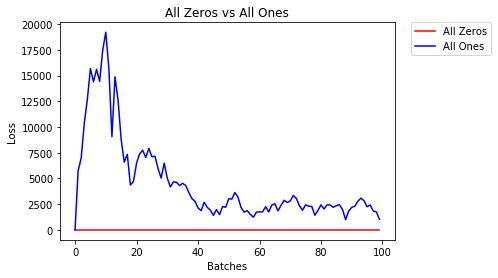

After 2 Epochs:
Validation Accuracy
    9.808% -- All Zeros
    9.867% -- All Ones
Training Loss
    2.302  -- All Zeros
  517.735  -- All Ones


In [50]:
import helpers

# put them in list form to compare
model_list = [(model_0, 'All Zeros'),
              (model_1, 'All Ones')]


# plot the loss over the first 100 batches
helpers.compare_init_weights(model_list, 
                             'All Zeros vs All Ones', 
                             train_loader,
                             valid_loader)

As you can see the accuracy is close to guessing for both zeros and ones, around 10%.

The neural network is having a hard time determining which weights need to be changed, since the neurons have the same output for each layer.  To avoid neurons with the same output, let's use unique weights.  We can also randomly select these weights to avoid being stuck in a local minimum for each run.

A good solution for getting these random weights is to sample from a uniform distribution.

### Uniform Distribution
A [uniform distribution](https://en.wikipedia.org/wiki/Uniform_distribution) has the equal probability of picking any number from a set of numbers. We'll be picking from a continuous distribution, so the chance of picking the same number is low. We'll use NumPy's `np.random.uniform` function to pick random numbers from a uniform distribution.

>#### [`np.random_uniform(low=0.0, high=1.0, size=None)`](https://docs.scipy.org/doc/numpy/reference/generated/numpy.random.uniform.html)
>Outputs random values from a uniform distribution.

>The generated values follow a uniform distribution in the range [low, high). The lower bound minval is included in the range, while the upper bound maxval is excluded.

>- **low:** The lower bound on the range of random values to generate. Defaults to 0.
- **high:** The upper bound on the range of random values to generate. Defaults to 1.
- **size:** An int or tuple of ints that specify the shape of the output array.

We can visualize the uniform distribution by using a histogram. Let's map the values from `np.random_uniform(-3, 3, [1000])` to a histogram using the `helper.hist_dist` function. This will be `1000` random float values from `-3` to `3`, excluding the value `3`.

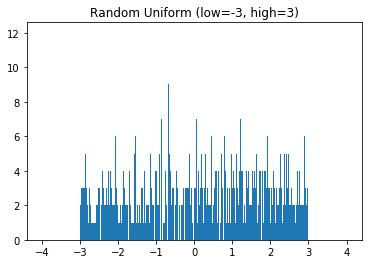

In [24]:
helpers.hist_dist('Random Uniform (low=-3, high=3)', np.random.uniform(-3, 3, [100000]))

The histogram used 500 buckets for the 1000 values.  Since the chance for any single bucket is the same, there should be around 2 values for each bucket. That's exactly what we see with the histogram.  Some buckets have more and some have less, but they trend around 2.

Now that you understand the uniform function, let's use PyTorch's `nn.init` to apply it to a model's initial weights.

### Uniform Initialization, Baseline


Let's see how well the neural network trains using a uniform weight initialization, where `low=0.0` and `high=1.0`. Below, I'll show you another way (besides in the Net class code) to initialize the weights of a network. To define weights outside of the model definition, you can:
>1. Define a function that assigns weights by the type of network layer, *then* 
2. Apply those weights to an initialized model using `model.apply(fn)`, which applies a function to each model layer.

This time, we'll use `weight.data.uniform_` to initialize the weights of our model, directly.

In [8]:
# takes in a module and applies the specified weight initialization
def weights_init_uniform(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # apply a uniform distribution to the weights and a bias=0
        m.weight.data.uniform_(0.0, 1.0)
        m.bias.data.fill_(0)

In [9]:
# create a new model with these weights
model_uniform = Net()
model_uniform.apply(weights_init_uniform)

Net(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

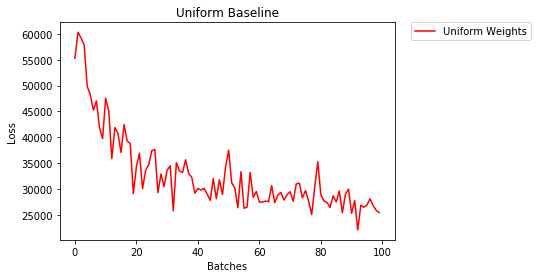

After 2 Epochs:
Validation Accuracy
   31.800% -- Uniform Weights
Training Loss
    6.182  -- Uniform Weights


In [10]:
# evaluate behavior 
helpers.compare_init_weights([(model_uniform, 'Uniform Weights')], 
                             'Uniform Baseline', 
                             train_loader,
                             valid_loader)

---
The loss graph is showing the neural network is learning, which it didn't with all zeros or all ones. We're headed in the right direction!

## General rule for setting weights
The general rule for setting the weights in a neural network is to set them to be close to zero without being too small. 
>Good practice is to start your weights in the range of $[-y, y]$ where $y=1/\sqrt{n}$  
($n$ is the number of inputs to a given neuron).

Let's see if this holds true; let's create a baseline to compare with and center our uniform range over zero by shifting it over by 0.5.  This will give us the range [-0.5, 0.5).

In [11]:
# takes in a module and applies the specified weight initialization
def weights_init_uniform_center(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # apply a centered, uniform distribution to the weights
        m.weight.data.uniform_(-0.5, 0.5)
        m.bias.data.fill_(0)

# create a new model with these weights
model_centered = Net()
model_centered.apply(weights_init_uniform_center)

Net(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

Then let's create a distribution and model that uses the **general rule** for weight initialization; using the range $[-y, y]$, where $y=1/\sqrt{n}$ .

And finally, we'll compare the two models.

In [12]:
# takes in a module and applies the specified weight initialization
def weights_init_uniform_rule(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # get the number of the inputs
        n = m.in_features
        y = 1.0/np.sqrt(n)
        m.weight.data.uniform_(-y, y)
        m.bias.data.fill_(0)

# create a new model with these weights
model_rule = Net()
model_rule.apply(weights_init_uniform_rule)

Net(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

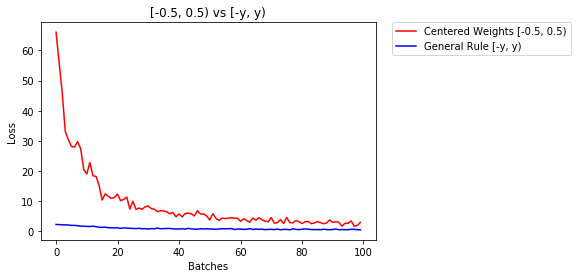

After 2 Epochs:
Validation Accuracy
   75.658% -- Centered Weights [-0.5, 0.5)
   83.858% -- General Rule [-y, y)
Training Loss
    0.504  -- Centered Weights [-0.5, 0.5)
    0.347  -- General Rule [-y, y)


In [13]:
# compare these two models
model_list = [(model_centered, 'Centered Weights [-0.5, 0.5)'), 
              (model_rule, 'General Rule [-y, y)')]

# evaluate behavior 
helpers.compare_init_weights(model_list, 
                             '[-0.5, 0.5) vs [-y, y)', 
                             train_loader,
                             valid_loader)

This behavior is really promising! Not only is the loss decreasing, but it seems to do so very quickly for our uniform weights that follow the general rule; after only two epochs we get a fairly high validation accuracy and this should give you some intuition for why starting out with the right initial weights can really help your training process!

---

Since the uniform distribution has the same chance to pick *any value* in a range, what if we used a distribution that had a higher chance of picking numbers closer to 0?  Let's look at the normal distribution.

### Normal Distribution
Unlike the uniform distribution, the [normal distribution](https://en.wikipedia.org/wiki/Normal_distribution) has a higher likelihood of picking number close to it's mean. To visualize it, let's plot values from NumPy's `np.random.normal` function to a histogram.

>[np.random.normal(loc=0.0, scale=1.0, size=None)](https://docs.scipy.org/doc/numpy/reference/generated/numpy.random.normal.html)

>Outputs random values from a normal distribution.

>- **loc:** The mean of the normal distribution.
- **scale:** The standard deviation of the normal distribution.
- **shape:** The shape of the output array.

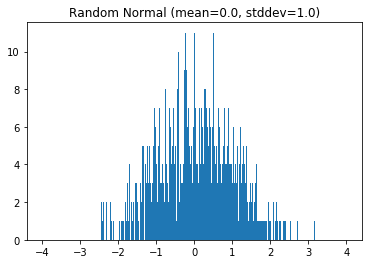

In [14]:
helpers.hist_dist('Random Normal (mean=0.0, stddev=1.0)', np.random.normal(size=[1000]))

Let's compare the normal distribution against the previous, rule-based, uniform distribution.

Below, we define a normal distribution that has a mean of 0 and a standard deviation of $y=1/\sqrt{n}$.

In [15]:
# takes in a module and applies the specified weight initialization
def weights_init_normal(m):
    classname = m.__class__.__name__
    # for every Linear layer in a model..
    if classname.find('Linear') != -1:
        # get the number of the inputs
        n = m.in_features
        y = (1.0/np.sqrt(n))
        m.weight.data.normal_(0, y)
        m.bias.data.fill_(0)

In [16]:
# create a new model with the rule-based, uniform weights
model_uniform_rule = Net()
model_uniform_rule.apply(weights_init_uniform_rule)

# create a new model with the rule-based, NORMAL weights
model_normal_rule = Net()
model_normal_rule.apply(weights_init_normal)

Net(
  (fc1): Linear(in_features=784, out_features=256, bias=True)
  (fc2): Linear(in_features=256, out_features=128, bias=True)
  (fc3): Linear(in_features=128, out_features=10, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

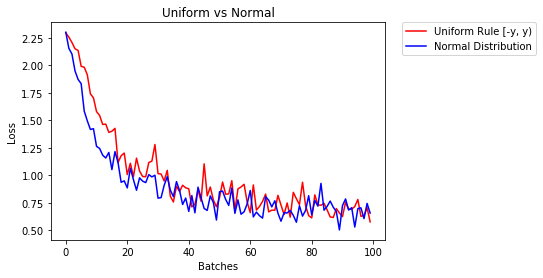

After 2 Epochs:
Validation Accuracy
   84.317% -- Uniform Rule [-y, y)
   84.417% -- Normal Distribution
Training Loss
    0.337  -- Uniform Rule [-y, y)
    0.435  -- Normal Distribution


In [17]:
# compare the two models
model_list = [(model_uniform_rule, 'Uniform Rule [-y, y)'), 
              (model_normal_rule, 'Normal Distribution')]

# evaluate behavior 
helpers.compare_init_weights(model_list, 
                             'Uniform vs Normal', 
                             train_loader,
                             valid_loader)

The normal distribution gives us pretty similar behavior compared to the uniform distribution, in this case. This is likely because our network is so small; a larger neural network will pick more weight values from each of these distributions, magnifying the effect of both initialization styles. In general, a normal distribution will result in better performance for a model.


---

### Automatic Initialization

Let's quickly take a look at what happens *without any explicit weight initialization*.

In [18]:
model_no_initialization = Net()

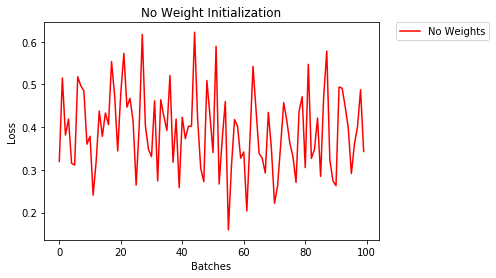

After 2 Epochs:
Validation Accuracy
   86.850% -- No Weights
Training Loss
    0.316  -- No Weights


In [20]:
model_list = [(model_no_initialization, 'No Weights')]

# evaluate behavior 
helpers.compare_init_weights(model_list, 
                             'No Weight Initialization', 
                             train_loader,
                             valid_loader)

### Default initialization

Something really interesting is happening here. You may notice that the red line "no weights" looks a lot like our uniformly initialized weights. It turns out that PyTorch has default weight initialization behavior for every kind of layer. You can see that **linear layers are initialized with a uniform distribution** (uniform weights _and_ biases) in [the module source code](https://pytorch.org/docs/stable/_modules/torch/nn/modules/linear.html).

---

However, you can also see that the weights taken from a normal distribution are comparable, perhaps even a little better! So, it may still be useful, especially if you are trying to train the best models, to initialize the weights of a model according to rules that *you* define.

And, this is not the end of your learning path! You're encouraged to look at the different types of [common initialization distributions](https://pytorch.org/docs/stable/nn.html#torch-nn-init). As you continue to learn in the classroom, you'll also see more resources for learning about and practicing weight initialization!